# Sentiment Analysis on Yelp reviews of Indian Restaurants in the US

In [1]:
import pandas as pd
import numpy as np

In [2]:
ind = pd.read_csv('yelp_mega_categories_indian.csv')

In [3]:
ind.head()

,business_id,name,address,city,state,postal_code,latitude,longitude,business_stars,attributes,categories,user_id,review_stars,text,date
0,f82dhKNiUXsDVPMLqKYiIQ,Sher-e-Punjab,853 East Grant Rd,Tucson,AZ,85719,32.25096,-110.959158,4.0,"{'RestaurantsAttire': ""'casual'"", 'BusinessAcc...","Restaurants, Salad, Pakistani, Indian, Cocktai...",nabJKapjKahYfTtnBDG6JQ,4,One of my most favorite Indian restaurants. No...,2011-04-22 02:02:10
1,f82dhKNiUXsDVPMLqKYiIQ,Sher-e-Punjab,853 East Grant Rd,Tucson,AZ,85719,32.25096,-110.959158,4.0,"{'RestaurantsAttire': ""'casual'"", 'BusinessAcc...","Restaurants, Salad, Pakistani, Indian, Cocktai...",SmaAK6il7pyldoqZrH7iTA,4,Food= Amazing\nService= Great\nPrices= Reasona...,2014-04-20 00:32:54
2,f82dhKNiUXsDVPMLqKYiIQ,Sher-e-Punjab,853 East Grant Rd,Tucson,AZ,85719,32.25096,-110.959158,4.0,"{'RestaurantsAttire': ""'casual'"", 'BusinessAcc...","Restaurants, Salad, Pakistani, Indian, Cocktai...",B6FbaEEn5Uh4kEqv4kUdgA,3,"OK lunch buffet, but too oily. i think weeken...",2005-03-12 03:47:06
3,f82dhKNiUXsDVPMLqKYiIQ,Sher-e-Punjab,853 East Grant Rd,Tucson,AZ,85719,32.25096,-110.959158,4.0,"{'RestaurantsAttire': ""'casual'"", 'BusinessAcc...","Restaurants, Salad, Pakistani, Indian, Cocktai...",OqTs0lHg5ZXvF1S0bJfzFA,5,"Favorite indian place in Tucson, hands down! M...",2013-01-28 02:55:30
4,f82dhKNiUXsDVPMLqKYiIQ,Sher-e-Punjab,853 East Grant Rd,Tucson,AZ,85719,32.25096,-110.959158,4.0,"{'RestaurantsAttire': ""'casual'"", 'BusinessAcc...","Restaurants, Salad, Pakistani, Indian, Cocktai...",QaBNIUwzgN4v_5wjmlJOCg,4,"I'm torn between 3 and 4 stars, but have decid...",2011-02-14 18:01:48


In [696]:
ind.head(3)

,index,business_id,name,address,city,state,postal_code,latitude,longitude,business_stars,attributes,categories,user_id,review_stars,text,date,date_2,year,concat
0,0,f82dhKNiUXsDVPMLqKYiIQ,Sher-e-Punjab,853 East Grant Rd,Tucson,AZ,85719,32.25096,-110.959158,4.0,"{'RestaurantsAttire': ""'casual'"", 'BusinessAcc...","Restaurants, Salad, Pakistani, Indian, Cocktai...",nabJKapjKahYfTtnBDG6JQ,4,One of my most favorite Indian restaurants. No...,2011-04-22 02:02:10,2011-04-22 02:02:10,2011,"Tucson,AZ"
1,1,f82dhKNiUXsDVPMLqKYiIQ,Sher-e-Punjab,853 East Grant Rd,Tucson,AZ,85719,32.25096,-110.959158,4.0,"{'RestaurantsAttire': ""'casual'"", 'BusinessAcc...","Restaurants, Salad, Pakistani, Indian, Cocktai...",SmaAK6il7pyldoqZrH7iTA,4,Food= Amazing\nService= Great\nPrices= Reasona...,2014-04-20 00:32:54,2014-04-20 00:32:54,2014,"Tucson,AZ"
2,2,f82dhKNiUXsDVPMLqKYiIQ,Sher-e-Punjab,853 East Grant Rd,Tucson,AZ,85719,32.25096,-110.959158,4.0,"{'RestaurantsAttire': ""'casual'"", 'BusinessAcc...","Restaurants, Salad, Pakistani, Indian, Cocktai...",B6FbaEEn5Uh4kEqv4kUdgA,3,"OK lunch buffet, but too oily. i think weeken...",2005-03-12 03:47:06,2005-03-12 03:47:06,2005,"Tucson,AZ"


In [4]:
ind.shape

(56425, 15)

In [5]:
# making copy of dataframe so that any  changeis made will not impact the orginal data
ind_1 = ind.copy()

In [6]:
from pandas.core import indexers
from numpy.lib import index_tricks
Indi_star_text=ind_1.drop(columns=[col for col in ind.columns if col not in ['review_stars', 'text']], inplace=False)

In [7]:
# Taking review star and text
Indi_star_text

,review_stars,text
0,4,One of my most favorite Indian restaurants. No...
1,4,Food= Amazing\nService= Great\nPrices= Reasona...
2,3,"OK lunch buffet, but too oily. i think weeken..."
3,5,"Favorite indian place in Tucson, hands down! M..."
4,4,"I'm torn between 3 and 4 stars, but have decid..."
...,...,...
56420,4,Bombay is the BOMB! \nCame here with friends f...
56421,4,I can get on board with this place. I really e...
56422,5,I am so happy I found this place! I crave thei...
56423,5,A bit pricy but worth it! I like the Chicken T...


In [8]:
Indi_star_text['review_stars'].unique()

array([4, 3, 5, 2, 1], dtype=int64)

Since we are working on sentimental analysis  we need to have three sentiment   Postive,Nagetive and Neutral in our target variable


In [9]:
# Define a function to map review stars to sentiment
def get_sentiment(stars):
    if stars in [5, 4]:
        return 'positive'
    elif stars == 3:
        return 'neutral'
    else:
        return 'negative'

# Apply the function to the review stars column and assign the result to the sentiment column
Indi_star_text['sentiment'] = Indi_star_text['review_stars'].apply(get_sentiment)

# Print the updated DataFrame
Indi_star_text

,review_stars,text,sentiment
0,4,One of my most favorite Indian restaurants. No...,positive
1,4,Food= Amazing\nService= Great\nPrices= Reasona...,positive
2,3,"OK lunch buffet, but too oily. i think weeken...",neutral
3,5,"Favorite indian place in Tucson, hands down! M...",positive
4,4,"I'm torn between 3 and 4 stars, but have decid...",positive
...,...,...,...
56420,4,Bombay is the BOMB! \nCame here with friends f...,positive
56421,4,I can get on board with this place. I really e...,positive
56422,5,I am so happy I found this place! I crave thei...,positive
56423,5,A bit pricy but worth it! I like the Chicken T...,positive


In [10]:
indi = Indi_star_text.copy()

In [11]:
indi.copy()

,review_stars,text,sentiment
0,4,One of my most favorite Indian restaurants. No...,positive
1,4,Food= Amazing\nService= Great\nPrices= Reasona...,positive
2,3,"OK lunch buffet, but too oily. i think weeken...",neutral
3,5,"Favorite indian place in Tucson, hands down! M...",positive
4,4,"I'm torn between 3 and 4 stars, but have decid...",positive
...,...,...,...
56420,4,Bombay is the BOMB! \nCame here with friends f...,positive
56421,4,I can get on board with this place. I really e...,positive
56422,5,I am so happy I found this place! I crave thei...,positive
56423,5,A bit pricy but worth it! I like the Chicken T...,positive


# Data Pre-processing

In [12]:
!pip install emoji

In [13]:
#general purpose packages
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
import seaborn as sns

#data processing
import re, string
import emoji
import nltk

from sklearn import preprocessing
from imblearn.over_sampling import RandomOverSampler
from sklearn.model_selection import train_test_split

#transformers
from transformers import BertTokenizerFast
from transformers import TFBertModel
from transformers import RobertaTokenizerFast
from transformers import TFRobertaModel

In [14]:
#transformers
from transformers import BertTokenizerFast
from transformers import TFBertModel
from transformers import RobertaTokenizerFast
from transformers import TFRobertaModel

#keras
import tensorflow as tf
from tensorflow import keras


#metrics
from sklearn.metrics import accuracy_score, f1_score
from sklearn.metrics import classification_report, confusion_matrix

#set seed for reproducibility
seed=42

#set style for plots
sns.set_style("whitegrid")
sns.despine()
plt.style.use("seaborn-whitegrid")
plt.rc("figure", autolayout=True)
plt.rc("axes", labelweight="bold", labelsize="large", titleweight="bold", titlepad=10)

<Figure size 432x288 with 0 Axes>

In [15]:
def conf_matrix(y, y_pred, title):
    fig, ax =plt.subplots(figsize=(5,5))
    labels=['Negative', 'Neutral', 'Positive']
    ax=sns.heatmap(confusion_matrix(y, y_pred), annot=True, cmap="Blues", fmt='g', cbar=False, annot_kws={"size":25})
    plt.title(title, fontsize=20)
    ax.xaxis.set_ticklabels(labels, fontsize=17) 
    ax.yaxis.set_ticklabels(labels, fontsize=17)
    ax.set_ylabel('Test', fontsize=20)
    ax.set_xlabel('Predicted', fontsize=20)
    plt.show()

In [16]:
ind.head()

,business_id,name,address,city,state,postal_code,latitude,longitude,business_stars,attributes,categories,user_id,review_stars,text,date
0,f82dhKNiUXsDVPMLqKYiIQ,Sher-e-Punjab,853 East Grant Rd,Tucson,AZ,85719,32.25096,-110.959158,4.0,"{'RestaurantsAttire': ""'casual'"", 'BusinessAcc...","Restaurants, Salad, Pakistani, Indian, Cocktai...",nabJKapjKahYfTtnBDG6JQ,4,One of my most favorite Indian restaurants. No...,2011-04-22 02:02:10
1,f82dhKNiUXsDVPMLqKYiIQ,Sher-e-Punjab,853 East Grant Rd,Tucson,AZ,85719,32.25096,-110.959158,4.0,"{'RestaurantsAttire': ""'casual'"", 'BusinessAcc...","Restaurants, Salad, Pakistani, Indian, Cocktai...",SmaAK6il7pyldoqZrH7iTA,4,Food= Amazing\nService= Great\nPrices= Reasona...,2014-04-20 00:32:54
2,f82dhKNiUXsDVPMLqKYiIQ,Sher-e-Punjab,853 East Grant Rd,Tucson,AZ,85719,32.25096,-110.959158,4.0,"{'RestaurantsAttire': ""'casual'"", 'BusinessAcc...","Restaurants, Salad, Pakistani, Indian, Cocktai...",B6FbaEEn5Uh4kEqv4kUdgA,3,"OK lunch buffet, but too oily. i think weeken...",2005-03-12 03:47:06
3,f82dhKNiUXsDVPMLqKYiIQ,Sher-e-Punjab,853 East Grant Rd,Tucson,AZ,85719,32.25096,-110.959158,4.0,"{'RestaurantsAttire': ""'casual'"", 'BusinessAcc...","Restaurants, Salad, Pakistani, Indian, Cocktai...",OqTs0lHg5ZXvF1S0bJfzFA,5,"Favorite indian place in Tucson, hands down! M...",2013-01-28 02:55:30
4,f82dhKNiUXsDVPMLqKYiIQ,Sher-e-Punjab,853 East Grant Rd,Tucson,AZ,85719,32.25096,-110.959158,4.0,"{'RestaurantsAttire': ""'casual'"", 'BusinessAcc...","Restaurants, Salad, Pakistani, Indian, Cocktai...",QaBNIUwzgN4v_5wjmlJOCg,4,"I'm torn between 3 and 4 stars, but have decid...",2011-02-14 18:01:48


In [17]:
ind.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 56425 entries, 0 to 56424
Data columns (total 15 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   business_id     56425 non-null  object 
 1   name            56425 non-null  object 
 2   address         56402 non-null  object 
 3   city            56425 non-null  object 
 4   state           56425 non-null  object 
 5   postal_code     56425 non-null  object 
 6   latitude        56425 non-null  float64
 7   longitude       56425 non-null  float64
 8   business_stars  56425 non-null  float64
 9   attributes      56356 non-null  object 
 10  categories      56425 non-null  object 
 11  user_id         56425 non-null  object 
 12  review_stars    56425 non-null  int64  
 13  text            56425 non-null  object 
 14  date            56425 non-null  object 
dtypes: float64(3), int64(1), object(11)
memory usage: 6.5+ MB


We convert the date column 'TweetAt' to pandas datetime format to improve its usability in the further analysis.

In [18]:
ind['date_2'] = pd.to_datetime(ind['date'])

In [19]:
ind['date_2'].head()

0   2011-04-22 02:02:10
1   2014-04-20 00:32:54
2   2005-03-12 03:47:06
3   2013-01-28 02:55:30
4   2011-02-14 18:01:48
Name: date_2, dtype: datetime64[ns]

In [20]:
ind['date']

0        2011-04-22 02:02:10
1        2014-04-20 00:32:54
2        2005-03-12 03:47:06
3        2013-01-28 02:55:30
4        2011-02-14 18:01:48
                ...         
56420    2020-11-10 14:41:12
56421    2020-06-19 02:02:34
56422    2020-02-28 22:46:35
56423    2021-12-04 03:00:38
56424    2022-01-07 16:58:43
Name: date, Length: 56425, dtype: object

### Drop Duplicates

In [21]:
indi.drop_duplicates(subset='text',inplace=True)

In [22]:
indi.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 56283 entries, 0 to 56424
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   review_stars  56283 non-null  int64 
 1   text          56283 non-null  object
 2   sentiment     56283 non-null  object
dtypes: int64(1), object(2)
memory usage: 1.7+ MB


In [23]:
text_per_day = ind['date_2'].dt.strftime('%m-%d').value_counts().sort_index().reset_index(name='counts')

In [24]:
ind['year'] = ind['date_2'].dt.year

In [25]:
ind.reset_index(inplace=True)

In [26]:
text_per_year = ind.groupby('year')['index'].count()

In [28]:
ind.head()

,index,business_id,name,address,city,state,postal_code,latitude,longitude,business_stars,attributes,categories,user_id,review_stars,text,date,date_2,year
0,0,f82dhKNiUXsDVPMLqKYiIQ,Sher-e-Punjab,853 East Grant Rd,Tucson,AZ,85719,32.25096,-110.959158,4.0,"{'RestaurantsAttire': ""'casual'"", 'BusinessAcc...","Restaurants, Salad, Pakistani, Indian, Cocktai...",nabJKapjKahYfTtnBDG6JQ,4,One of my most favorite Indian restaurants. No...,2011-04-22 02:02:10,2011-04-22 02:02:10,2011
1,1,f82dhKNiUXsDVPMLqKYiIQ,Sher-e-Punjab,853 East Grant Rd,Tucson,AZ,85719,32.25096,-110.959158,4.0,"{'RestaurantsAttire': ""'casual'"", 'BusinessAcc...","Restaurants, Salad, Pakistani, Indian, Cocktai...",SmaAK6il7pyldoqZrH7iTA,4,Food= Amazing\nService= Great\nPrices= Reasona...,2014-04-20 00:32:54,2014-04-20 00:32:54,2014
2,2,f82dhKNiUXsDVPMLqKYiIQ,Sher-e-Punjab,853 East Grant Rd,Tucson,AZ,85719,32.25096,-110.959158,4.0,"{'RestaurantsAttire': ""'casual'"", 'BusinessAcc...","Restaurants, Salad, Pakistani, Indian, Cocktai...",B6FbaEEn5Uh4kEqv4kUdgA,3,"OK lunch buffet, but too oily. i think weeken...",2005-03-12 03:47:06,2005-03-12 03:47:06,2005
3,3,f82dhKNiUXsDVPMLqKYiIQ,Sher-e-Punjab,853 East Grant Rd,Tucson,AZ,85719,32.25096,-110.959158,4.0,"{'RestaurantsAttire': ""'casual'"", 'BusinessAcc...","Restaurants, Salad, Pakistani, Indian, Cocktai...",OqTs0lHg5ZXvF1S0bJfzFA,5,"Favorite indian place in Tucson, hands down! M...",2013-01-28 02:55:30,2013-01-28 02:55:30,2013
4,4,f82dhKNiUXsDVPMLqKYiIQ,Sher-e-Punjab,853 East Grant Rd,Tucson,AZ,85719,32.25096,-110.959158,4.0,"{'RestaurantsAttire': ""'casual'"", 'BusinessAcc...","Restaurants, Salad, Pakistani, Indian, Cocktai...",QaBNIUwzgN4v_5wjmlJOCg,4,"I'm torn between 3 and 4 stars, but have decid...",2011-02-14 18:01:48,2011-02-14 18:01:48,2011


In [29]:
df = pd.DataFrame(text_per_year)

In [30]:
df.rename(columns={'index':'count'}, inplace=True)

In [31]:
df.reset_index(inplace=True)

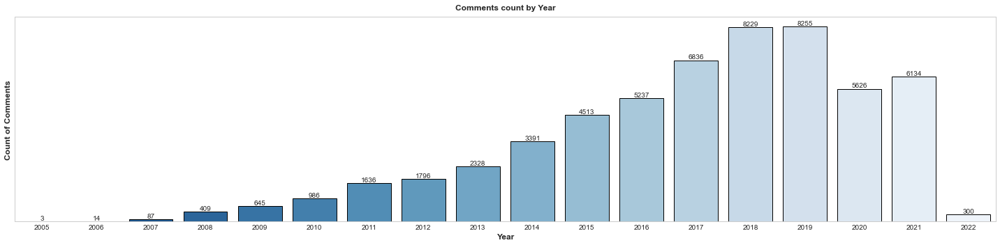

In [32]:
plt.figure(figsize=(20,5))
ax = sns.barplot(x='year', y='count', data=df, edgecolor = 'black',ci=False, palette='Blues_r')
plt.title('Comments count by Year')
plt.yticks([])
ax.bar_label(ax.containers[0])
plt.ylabel('Count of Comments')
plt.xlabel('Year')
plt.show()

In [33]:
ind['concat'] = ind['city'] + ',' + ind['state']

In [34]:
tweets_per_country = ind['concat'].value_counts().loc[lambda x : x > 100].reset_index(name='counts')

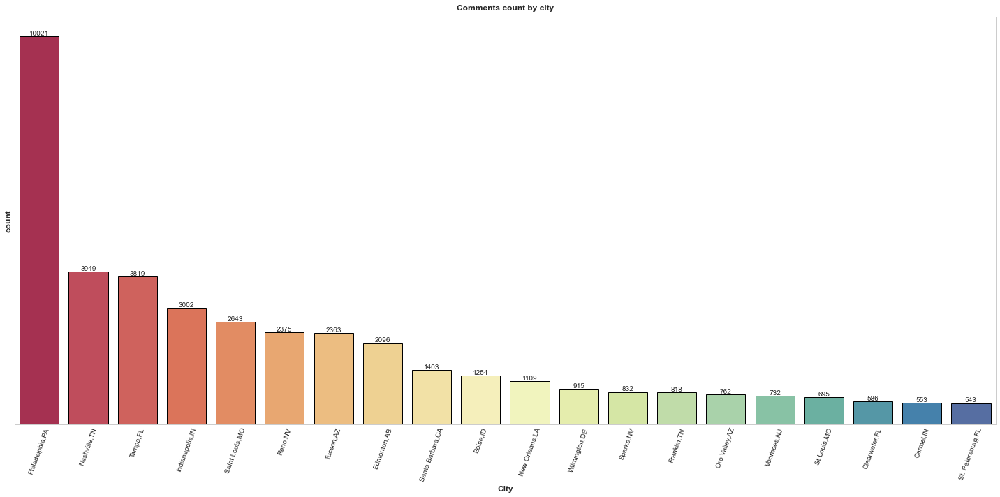

In [35]:
plt.figure(figsize=(20, 10))
top_20 = tweets_per_country.nlargest(20, 'counts')
ax = sns.barplot(x='index', y='counts', data=top_20,edgecolor = 'black',ci=False, palette='Spectral')
plt.title('Comments count by city')
plt.xticks(rotation=70)
plt.yticks([])
ax.bar_label(ax.containers[0])
plt.ylabel('count')
plt.xlabel('City')
plt.show()

# Reviews Deep Cleaning

In [36]:
indi2 = indi[['text','sentiment']]

In [37]:
indi2_test = indi[['text','sentiment']]

In [38]:
indi2.head()

,text,sentiment
0,One of my most favorite Indian restaurants. No...,positive
1,Food= Amazing\nService= Great\nPrices= Reasona...,positive
2,"OK lunch buffet, but too oily. i think weeken...",neutral
3,"Favorite indian place in Tucson, hands down! M...",positive
4,"I'm torn between 3 and 4 stars, but have decid...",positive


## Clean the tweets

In [39]:
import re
import emoji

# Create regex pattern to match all emoji characters
emoji_pattern = re.compile("["
        u"\U0001F600-\U0001F64F"  # emoticons
        u"\U0001F300-\U0001F5FF"  # symbols & pictographs
        u"\U0001F680-\U0001F6FF"  # transport & map symbols
        u"\U0001F1E0-\U0001F1FF"  # flags (iOS)
                           "]+", flags=re.UNICODE)

# Updated strip_emoji() function that uses emoji_pattern
def strip_emoji(text):
    return emoji_pattern.sub('', text)

# Rest of the code remains the same
def strip_all_entities(text): 
    text = text.replace('\r', '').replace('\n', ' ').replace('\n', ' ').lower() #remove \n and \r and lowercase
    text = re.sub(r"(?:\@|https?\://)\S+", "", text) #remove links and mentions
    text = re.sub(r'[^\x00-\x7f]',r'', text) #remove non utf8/ascii characters such as '\x9a\x91\x97\x9a\x97'
    banned_list= string.punctuation + 'Ã'+'±'+'ã'+'¼'+'â'+'»'+'§'
    table = str.maketrans('', '', banned_list)
    text = text.translate(table)
    return text

def clean_hashtags(tweet):
    new_tweet = " ".join(word.strip() for word in re.split('#(?!(?:hashtag)\b)[\w-]+(?=(?:\s+#[\w-]+)*\s*$)', tweet)) #remove last hashtags
    new_tweet2 = " ".join(word.strip() for word in re.split('#|_', new_tweet)) #remove hashtags symbol from words in the middle of the sentence
    return new_tweet2

def filter_chars(a):
    sent = []
    for word in a.split(' '):
        if ('$' in word) | ('&' in word):
            sent.append('')
        else:
            sent.append(word)
    return ' '.join(sent)

def remove_mult_spaces(text): # remove multiple spaces
    return re.sub("\s\s+" , " ", text)


In [40]:
texts_new = []
for t in indi2.text:
    texts_new.append(remove_mult_spaces(filter_chars(clean_hashtags(strip_all_entities(strip_emoji(t))))))

In [41]:
texts_new_test = []
for t in indi2_test.text:
    texts_new_test.append(remove_mult_spaces(filter_chars(clean_hashtags(strip_all_entities(strip_emoji(t))))))

Now we can create a new column, for both train and test sets, to host the cleaned version of the tweets' text.

In [42]:
indi2['text_clean'] = texts_new
indi2['text_clean'] = texts_new_test

In [43]:
indi2.head()

,text,sentiment,text_clean
0,One of my most favorite Indian restaurants. No...,positive,one of my most favorite indian restaurants not...
1,Food= Amazing\nService= Great\nPrices= Reasona...,positive,food amazing service great prices reasonable s...
2,"OK lunch buffet, but too oily. i think weeken...",neutral,ok lunch buffet but too oily i think weekend b...
3,"Favorite indian place in Tucson, hands down! M...",positive,favorite indian place in tucson hands down mos...
4,"I'm torn between 3 and 4 stars, but have decid...",positive,im torn between 3 and 4 stars but have decided...


In [44]:
indi2['text_clean'].head()

0    one of my most favorite indian restaurants not...
1    food amazing service great prices reasonable s...
2    ok lunch buffet but too oily i think weekend b...
3    favorite indian place in tucson hands down mos...
4    im torn between 3 and 4 stars but have decided...
Name: text_clean, dtype: object

In [45]:
indi2_test.head()

,text,sentiment
0,One of my most favorite Indian restaurants. No...,positive
1,Food= Amazing\nService= Great\nPrices= Reasona...,positive
2,"OK lunch buffet, but too oily. i think weeken...",neutral
3,"Favorite indian place in Tucson, hands down! M...",positive
4,"I'm torn between 3 and 4 stars, but have decid...",positive


In [46]:
indi2['text_clean'][1:8].values

array(['food amazing service great prices reasonable stop reading and start eating',
       'ok lunch buffet but too oily i think weekend buffet is better than weekday',
       'favorite indian place in tucson hands down most always get meat samosas tiki marsala veggie korma rice and naan never disappoints the only complaint is one time on a to go order they forgot their delicious sauces for the samosas but only happened once otherwise get ready for a party of flavors and spices in your mouth',
       'im torn between 3 and 4 stars but have decided to go with the more generous offering why because this place has one of the most generous menus as far as choices go there is a ton to choose from even if youre vegetarian formalities firstwhy cant there be some ambiance at indian restaurants i know im painting with broad strokes here but it seems like outside of nyc no indian restaurant in the us can get creative with their dining space not sure why that is but whatever an early arrival on 

Moreover, we will also create a column to host the lenght of the cleaned text, to check if by cleaning the text we removed too much text or almost entirely the tweet!

In [47]:
text_len = []
for text in indi2.text_clean:
    tweet_len = len(text.split())
    text_len.append(tweet_len)

In [48]:
indi2['text_len'] = text_len

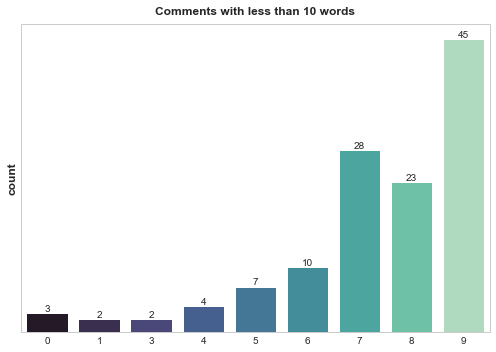

In [49]:
plt.figure(figsize=(7,5))
ax = sns.countplot(x='text_len', data=indi2[indi2['text_len']<10], palette='mako')
plt.title('Comments with less than 10 words')
plt.yticks([])
ax.bar_label(ax.containers[0])
plt.ylabel('count')
plt.xlabel('')
plt.show()

As we can see, there are lots of cleaned tweets with 0 words: this is due to the cleaning performed before. This means that some tweets contained only mentions, hashtags and links, which have been removed. We will drop these empty tweets and also those with less than 5 words.

In [50]:
print(f" INDI2 SHAPE: {indi2.shape}")

 INDI2 SHAPE: (56283, 4)


In [51]:
indi2 = indi2[indi2['text_len'] > 4]

In [52]:
print(f" INDI2 SHAPE: {indi2.shape}")

 INDI2 SHAPE: (56272, 4)


# Training data deeper cleaning

In [53]:
tokenizer = BertTokenizerFast.from_pretrained('bert-base-uncased')

In [54]:
token_lens = []

for txt in indi2['text_clean'].values:
    tokens = tokenizer.encode(txt, max_length=512, truncation=True)
    token_lens.append(len(tokens))
    
max_len=np.max(token_lens)

In [55]:
print(f"MAX TOKENIZED SENTENCE LENGTH: {max_len}")

MAX TOKENIZED SENTENCE LENGTH: 512


In [56]:
token_lens = []

for i,txt in enumerate(indi2['text_clean'].values):
    tokens = tokenizer.encode(txt, max_length=512, truncation=True)
    token_lens.append(len(tokens))
    if len(tokens)>200:
        print(f"INDEX: {i}, TEXT: {txt}") 

INDEX: 4, TEXT: im torn between 3 and 4 stars but have decided to go with the more generous offering why because this place has one of the most generous menus as far as choices go there is a ton to choose from even if youre vegetarian formalities firstwhy cant there be some ambiance at indian restaurants i know im painting with broad strokes here but it seems like outside of nyc no indian restaurant in the us can get creative with their dining space not sure why that is but whatever an early arrival on a sunday found the place quiet with maybe 10 or so people dining no problem getting a table for 2 we started the evening off with some garlic naan delicious although i think next time ill stick with regular at almost half the cost we also got some finger paneer little spiced fried cubes of cheese these were denser than typical paneer the cheese was slightly bland but the spices were good overall an enjoyable start to the meal i also had a lemonade which may have been made fresh regardles

In [57]:
indi2['token_lens'] = token_lens

In [58]:
indi3 = indi2.sort_values(by='token_lens', ascending=False)
indi3.head(20)

,text,sentiment,text_clean,text_len,token_lens
16322,"Maneet Chauhan is one of my favorite chefs, an...",positive,maneet chauhan is one of my favorite chefs and...,480,512
45370,"I live just a block away, so I really really w...",negative,i live just a block away so i really really wa...,496,512
14352,I'm not Indian and not really a huge Indian fo...,positive,im not indian and not really a huge indian foo...,730,512
11273,After having had such a wonderful experience a...,positive,after having had such a wonderful experience a...,491,512
8034,My girlfriend and I were at Indeblue this Wedn...,positive,my girlfriend and i were at indeblue this wedn...,673,512
44775,My husband and I visited yesterday evening and...,positive,my husband and i visited yesterday evening and...,662,512
55349,I was SO excited to try this place. I'm not su...,negative,i was so excited to try this place im not sure...,643,512
44984,I gave them ONE star and would give HALF if I ...,negative,i gave them one star and would give half if i ...,509,512
55352,tHe FuNky tAco. Quirky charm in how they lay ...,positive,the funky taco quirky charm in how they lay ou...,830,512
4033,If one was smart enough to understand brain su...,positive,if one was smart enough to understand brain su...,875,512


In [59]:
indi3 = indi2.iloc[12:]
indi3.head()

,text,sentiment,text_clean,text_len,token_lens
12,I went here with a group of friends and we had...,positive,i went here with a group of friends and we had...,37,40
13,"I hadn't had Indian food before going here, an...",positive,i hadnt had indian food before going here and ...,295,336
14,Food was amazingly good. Loved the tikka masal...,positive,food was amazingly good loved the tikka masala...,23,29
15,"On a scale from good to Indian, this place sco...",neutral,on a scale from good to indian this place scor...,63,67
16,This place has the best chicken tikka masala c...,positive,this place has the best chicken tikka masala c...,49,57


### Stopwords removal

In [60]:
import re
import string
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer

def preprocess_text(sent):
    
    # Convert text to lowercase
    sent = sent.apply(lambda x: x.lower())
    
    # Remove URLs
    sent = sent.apply(lambda x: re.sub(r'https?\S+', '', x))
    
    # Remove non-alphanumeric characters and punctuation
    sent = sent.apply(lambda x: re.sub(r'[^a-zA-Z0-9\s]', ' ', x))
    
    # Remove extra whitespace
    sent = sent.apply(lambda x: re.sub(r'\s+', ' ', x).strip())
    
    # Remove stop words
    stop_words = set(stopwords.words('english'))
    sent = sent.apply(lambda x: ' '.join([word for word in x.split() if word not in stop_words]))
    
    # Perform lemmatization
    lemmatizer = WordNetLemmatizer()
    sent = sent.apply(lambda x: ' '.join([lemmatizer.lemmatize(word) for word in x.split()]))
    
    return sent

In [61]:
indi2.head()

,text,sentiment,text_clean,text_len,token_lens
0,One of my most favorite Indian restaurants. No...,positive,one of my most favorite indian restaurants not...,130,148
1,Food= Amazing\nService= Great\nPrices= Reasona...,positive,food amazing service great prices reasonable s...,11,13
2,"OK lunch buffet, but too oily. i think weeken...",neutral,ok lunch buffet but too oily i think weekend b...,14,17
3,"Favorite indian place in Tucson, hands down! M...",positive,favorite indian place in tucson hands down mos...,57,74
4,"I'm torn between 3 and 4 stars, but have decid...",positive,im torn between 3 and 4 stars but have decided...,294,336


In [62]:
indi2['text_ppd'] = preprocess_text(indi2['text_clean'])

In [63]:
indi2.head()

,text,sentiment,text_clean,text_len,token_lens,text_ppd
0,One of my most favorite Indian restaurants. No...,positive,one of my most favorite indian restaurants not...,130,148,one favorite indian restaurant nothing fancy a...
1,Food= Amazing\nService= Great\nPrices= Reasona...,positive,food amazing service great prices reasonable s...,11,13,food amazing service great price reasonable st...
2,"OK lunch buffet, but too oily. i think weeken...",neutral,ok lunch buffet but too oily i think weekend b...,14,17,ok lunch buffet oily think weekend buffet bett...
3,"Favorite indian place in Tucson, hands down! M...",positive,favorite indian place in tucson hands down mos...,57,74,favorite indian place tucson hand always get m...
4,"I'm torn between 3 and 4 stars, but have decid...",positive,im torn between 3 and 4 stars but have decided...,294,336,im torn 3 4 star decided go generous offering ...


In [131]:
from nltk.tokenize import word_tokenize

In [132]:
# Tokenize the preprocessed text
indi2['text_tok'] = indi2['text_ppd'].apply(lambda x: word_tokenize(x))

In [133]:
indi2.head()

,text,sentiment,text_clean,text_len,token_lens,text_ppd,text_tok
0,One of my most favorite Indian restaurants. No...,positive,one of my most favorite indian restaurants not...,130,148,one favorite indian restaurant nothing fancy a...,"[one, favorite, indian, restaurant, nothing, f..."
1,Food= Amazing\nService= Great\nPrices= Reasona...,positive,food amazing service great prices reasonable s...,11,13,food amazing service great price reasonable st...,"[food, amazing, service, great, price, reasona..."
2,"OK lunch buffet, but too oily. i think weeken...",neutral,ok lunch buffet but too oily i think weekend b...,14,17,ok lunch buffet oily think weekend buffet bett...,"[ok, lunch, buffet, oily, think, weekend, buff..."
3,"Favorite indian place in Tucson, hands down! M...",positive,favorite indian place in tucson hands down mos...,57,74,favorite indian place tucson hand always get m...,"[favorite, indian, place, tucson, hand, always..."
4,"I'm torn between 3 and 4 stars, but have decid...",positive,im torn between 3 and 4 stars but have decided...,294,336,im torn 3 4 star decided go generous offering ...,"[im, torn, 3, 4, star, decided, go, generous, ..."


In [144]:
indi2.reset_index(inplace=True)

In [145]:
indi2.shape, ind.shape

((56272, 8), (56425, 19))

# Data Merge

In [141]:
ind.head()

,index,business_id,name,address,city,state,postal_code,latitude,longitude,business_stars,attributes,categories,user_id,review_stars,text,date,date_2,year,concat
0,0,f82dhKNiUXsDVPMLqKYiIQ,Sher-e-Punjab,853 East Grant Rd,Tucson,AZ,85719,32.25096,-110.959158,4.0,"{'RestaurantsAttire': ""'casual'"", 'BusinessAcc...","Restaurants, Salad, Pakistani, Indian, Cocktai...",nabJKapjKahYfTtnBDG6JQ,4,One of my most favorite Indian restaurants. No...,2011-04-22 02:02:10,2011-04-22 02:02:10,2011,"Tucson,AZ"
1,1,f82dhKNiUXsDVPMLqKYiIQ,Sher-e-Punjab,853 East Grant Rd,Tucson,AZ,85719,32.25096,-110.959158,4.0,"{'RestaurantsAttire': ""'casual'"", 'BusinessAcc...","Restaurants, Salad, Pakistani, Indian, Cocktai...",SmaAK6il7pyldoqZrH7iTA,4,Food= Amazing\nService= Great\nPrices= Reasona...,2014-04-20 00:32:54,2014-04-20 00:32:54,2014,"Tucson,AZ"
2,2,f82dhKNiUXsDVPMLqKYiIQ,Sher-e-Punjab,853 East Grant Rd,Tucson,AZ,85719,32.25096,-110.959158,4.0,"{'RestaurantsAttire': ""'casual'"", 'BusinessAcc...","Restaurants, Salad, Pakistani, Indian, Cocktai...",B6FbaEEn5Uh4kEqv4kUdgA,3,"OK lunch buffet, but too oily. i think weeken...",2005-03-12 03:47:06,2005-03-12 03:47:06,2005,"Tucson,AZ"
3,3,f82dhKNiUXsDVPMLqKYiIQ,Sher-e-Punjab,853 East Grant Rd,Tucson,AZ,85719,32.25096,-110.959158,4.0,"{'RestaurantsAttire': ""'casual'"", 'BusinessAcc...","Restaurants, Salad, Pakistani, Indian, Cocktai...",OqTs0lHg5ZXvF1S0bJfzFA,5,"Favorite indian place in Tucson, hands down! M...",2013-01-28 02:55:30,2013-01-28 02:55:30,2013,"Tucson,AZ"
4,4,f82dhKNiUXsDVPMLqKYiIQ,Sher-e-Punjab,853 East Grant Rd,Tucson,AZ,85719,32.25096,-110.959158,4.0,"{'RestaurantsAttire': ""'casual'"", 'BusinessAcc...","Restaurants, Salad, Pakistani, Indian, Cocktai...",QaBNIUwzgN4v_5wjmlJOCg,4,"I'm torn between 3 and 4 stars, but have decid...",2011-02-14 18:01:48,2011-02-14 18:01:48,2011,"Tucson,AZ"


In [146]:
indi2.head()

,index,text,sentiment,text_clean,text_len,token_lens,text_ppd,text_tok
0,0,One of my most favorite Indian restaurants. No...,positive,one of my most favorite indian restaurants not...,130,148,one favorite indian restaurant nothing fancy a...,"[one, favorite, indian, restaurant, nothing, f..."
1,1,Food= Amazing\nService= Great\nPrices= Reasona...,positive,food amazing service great prices reasonable s...,11,13,food amazing service great price reasonable st...,"[food, amazing, service, great, price, reasona..."
2,2,"OK lunch buffet, but too oily. i think weeken...",neutral,ok lunch buffet but too oily i think weekend b...,14,17,ok lunch buffet oily think weekend buffet bett...,"[ok, lunch, buffet, oily, think, weekend, buff..."
3,3,"Favorite indian place in Tucson, hands down! M...",positive,favorite indian place in tucson hands down mos...,57,74,favorite indian place tucson hand always get m...,"[favorite, indian, place, tucson, hand, always..."
4,4,"I'm torn between 3 and 4 stars, but have decid...",positive,im torn between 3 and 4 stars but have decided...,294,336,im torn 3 4 star decided go generous offering ...,"[im, torn, 3, 4, star, decided, go, generous, ..."


In [699]:
indi2[['text', 'text_ppd', 'text_tok','sentiment']].head(3)

,text,text_ppd,text_tok,sentiment
0,One of my most favorite Indian restaurants. No...,one favorite indian restaurant nothing fancy a...,"[one, favorite, indian, restaurant, nothing, f...",positive
1,Food= Amazing\nService= Great\nPrices= Reasona...,food amazing service great price reasonable st...,"[food, amazing, service, great, price, reasona...",positive
2,"OK lunch buffet, but too oily. i think weeken...",ok lunch buffet oily think weekend buffet bett...,"[ok, lunch, buffet, oily, think, weekend, buff...",neutral


In [147]:
merged = pd.merge(ind, indi2, on='index', how='inner')

In [148]:
pd.options.display.max_columns = None # Show all columns

In [149]:
merged.head()

,index,business_id,name,address,city,state,postal_code,latitude,longitude,business_stars,attributes,categories,user_id,review_stars,text_x,date,date_2,year,concat,text_y,sentiment,text_clean,text_len,token_lens,text_ppd,text_tok
0,0,f82dhKNiUXsDVPMLqKYiIQ,Sher-e-Punjab,853 East Grant Rd,Tucson,AZ,85719,32.25096,-110.959158,4.0,"{'RestaurantsAttire': ""'casual'"", 'BusinessAcc...","Restaurants, Salad, Pakistani, Indian, Cocktai...",nabJKapjKahYfTtnBDG6JQ,4,One of my most favorite Indian restaurants. No...,2011-04-22 02:02:10,2011-04-22 02:02:10,2011,"Tucson,AZ",One of my most favorite Indian restaurants. No...,positive,one of my most favorite indian restaurants not...,130,148,one favorite indian restaurant nothing fancy a...,"[one, favorite, indian, restaurant, nothing, f..."
1,1,f82dhKNiUXsDVPMLqKYiIQ,Sher-e-Punjab,853 East Grant Rd,Tucson,AZ,85719,32.25096,-110.959158,4.0,"{'RestaurantsAttire': ""'casual'"", 'BusinessAcc...","Restaurants, Salad, Pakistani, Indian, Cocktai...",SmaAK6il7pyldoqZrH7iTA,4,Food= Amazing\nService= Great\nPrices= Reasona...,2014-04-20 00:32:54,2014-04-20 00:32:54,2014,"Tucson,AZ",Food= Amazing\nService= Great\nPrices= Reasona...,positive,food amazing service great prices reasonable s...,11,13,food amazing service great price reasonable st...,"[food, amazing, service, great, price, reasona..."
2,2,f82dhKNiUXsDVPMLqKYiIQ,Sher-e-Punjab,853 East Grant Rd,Tucson,AZ,85719,32.25096,-110.959158,4.0,"{'RestaurantsAttire': ""'casual'"", 'BusinessAcc...","Restaurants, Salad, Pakistani, Indian, Cocktai...",B6FbaEEn5Uh4kEqv4kUdgA,3,"OK lunch buffet, but too oily. i think weeken...",2005-03-12 03:47:06,2005-03-12 03:47:06,2005,"Tucson,AZ","OK lunch buffet, but too oily. i think weeken...",neutral,ok lunch buffet but too oily i think weekend b...,14,17,ok lunch buffet oily think weekend buffet bett...,"[ok, lunch, buffet, oily, think, weekend, buff..."
3,3,f82dhKNiUXsDVPMLqKYiIQ,Sher-e-Punjab,853 East Grant Rd,Tucson,AZ,85719,32.25096,-110.959158,4.0,"{'RestaurantsAttire': ""'casual'"", 'BusinessAcc...","Restaurants, Salad, Pakistani, Indian, Cocktai...",OqTs0lHg5ZXvF1S0bJfzFA,5,"Favorite indian place in Tucson, hands down! M...",2013-01-28 02:55:30,2013-01-28 02:55:30,2013,"Tucson,AZ","Favorite indian place in Tucson, hands down! M...",positive,favorite indian place in tucson hands down mos...,57,74,favorite indian place tucson hand always get m...,"[favorite, indian, place, tucson, hand, always..."
4,4,f82dhKNiUXsDVPMLqKYiIQ,Sher-e-Punjab,853 East Grant Rd,Tucson,AZ,85719,32.25096,-110.959158,4.0,"{'RestaurantsAttire': ""'casual'"", 'BusinessAcc...","Restaurants, Salad, Pakistani, Indian, Cocktai...",QaBNIUwzgN4v_5wjmlJOCg,4,"I'm torn between 3 and 4 stars, but have decid...",2011-02-14 18:01:48,2011-02-14 18:01:48,2011,"Tucson,AZ","I'm torn between 3 and 4 stars, but have decid...",positive,im torn between 3 and 4 stars but have decided...,294,336,im torn 3 4 star decided go generous offering ...,"[im, torn, 3, 4, star, decided, go, generous, ..."


In [150]:
merged = merged.drop(columns=['text_x'])

In [151]:
merged.head()

,index,business_id,name,address,city,state,postal_code,latitude,longitude,business_stars,attributes,categories,user_id,review_stars,date,date_2,year,concat,text_y,sentiment,text_clean,text_len,token_lens,text_ppd,text_tok
0,0,f82dhKNiUXsDVPMLqKYiIQ,Sher-e-Punjab,853 East Grant Rd,Tucson,AZ,85719,32.25096,-110.959158,4.0,"{'RestaurantsAttire': ""'casual'"", 'BusinessAcc...","Restaurants, Salad, Pakistani, Indian, Cocktai...",nabJKapjKahYfTtnBDG6JQ,4,2011-04-22 02:02:10,2011-04-22 02:02:10,2011,"Tucson,AZ",One of my most favorite Indian restaurants. No...,positive,one of my most favorite indian restaurants not...,130,148,one favorite indian restaurant nothing fancy a...,"[one, favorite, indian, restaurant, nothing, f..."
1,1,f82dhKNiUXsDVPMLqKYiIQ,Sher-e-Punjab,853 East Grant Rd,Tucson,AZ,85719,32.25096,-110.959158,4.0,"{'RestaurantsAttire': ""'casual'"", 'BusinessAcc...","Restaurants, Salad, Pakistani, Indian, Cocktai...",SmaAK6il7pyldoqZrH7iTA,4,2014-04-20 00:32:54,2014-04-20 00:32:54,2014,"Tucson,AZ",Food= Amazing\nService= Great\nPrices= Reasona...,positive,food amazing service great prices reasonable s...,11,13,food amazing service great price reasonable st...,"[food, amazing, service, great, price, reasona..."
2,2,f82dhKNiUXsDVPMLqKYiIQ,Sher-e-Punjab,853 East Grant Rd,Tucson,AZ,85719,32.25096,-110.959158,4.0,"{'RestaurantsAttire': ""'casual'"", 'BusinessAcc...","Restaurants, Salad, Pakistani, Indian, Cocktai...",B6FbaEEn5Uh4kEqv4kUdgA,3,2005-03-12 03:47:06,2005-03-12 03:47:06,2005,"Tucson,AZ","OK lunch buffet, but too oily. i think weeken...",neutral,ok lunch buffet but too oily i think weekend b...,14,17,ok lunch buffet oily think weekend buffet bett...,"[ok, lunch, buffet, oily, think, weekend, buff..."
3,3,f82dhKNiUXsDVPMLqKYiIQ,Sher-e-Punjab,853 East Grant Rd,Tucson,AZ,85719,32.25096,-110.959158,4.0,"{'RestaurantsAttire': ""'casual'"", 'BusinessAcc...","Restaurants, Salad, Pakistani, Indian, Cocktai...",OqTs0lHg5ZXvF1S0bJfzFA,5,2013-01-28 02:55:30,2013-01-28 02:55:30,2013,"Tucson,AZ","Favorite indian place in Tucson, hands down! M...",positive,favorite indian place in tucson hands down mos...,57,74,favorite indian place tucson hand always get m...,"[favorite, indian, place, tucson, hand, always..."
4,4,f82dhKNiUXsDVPMLqKYiIQ,Sher-e-Punjab,853 East Grant Rd,Tucson,AZ,85719,32.25096,-110.959158,4.0,"{'RestaurantsAttire': ""'casual'"", 'BusinessAcc...","Restaurants, Salad, Pakistani, Indian, Cocktai...",QaBNIUwzgN4v_5wjmlJOCg,4,2011-02-14 18:01:48,2011-02-14 18:01:48,2011,"Tucson,AZ","I'm torn between 3 and 4 stars, but have decid...",positive,im torn between 3 and 4 stars but have decided...,294,336,im torn 3 4 star decided go generous offering ...,"[im, torn, 3, 4, star, decided, go, generous, ..."


In [153]:
merged = merged.rename(columns={'text_y': 'text'})

In [154]:
merged.head()

,index,business_id,name,address,city,state,postal_code,latitude,longitude,business_stars,attributes,categories,user_id,review_stars,date,date_2,year,concat,text,sentiment,text_clean,text_len,token_lens,text_ppd,text_tok
0,0,f82dhKNiUXsDVPMLqKYiIQ,Sher-e-Punjab,853 East Grant Rd,Tucson,AZ,85719,32.25096,-110.959158,4.0,"{'RestaurantsAttire': ""'casual'"", 'BusinessAcc...","Restaurants, Salad, Pakistani, Indian, Cocktai...",nabJKapjKahYfTtnBDG6JQ,4,2011-04-22 02:02:10,2011-04-22 02:02:10,2011,"Tucson,AZ",One of my most favorite Indian restaurants. No...,positive,one of my most favorite indian restaurants not...,130,148,one favorite indian restaurant nothing fancy a...,"[one, favorite, indian, restaurant, nothing, f..."
1,1,f82dhKNiUXsDVPMLqKYiIQ,Sher-e-Punjab,853 East Grant Rd,Tucson,AZ,85719,32.25096,-110.959158,4.0,"{'RestaurantsAttire': ""'casual'"", 'BusinessAcc...","Restaurants, Salad, Pakistani, Indian, Cocktai...",SmaAK6il7pyldoqZrH7iTA,4,2014-04-20 00:32:54,2014-04-20 00:32:54,2014,"Tucson,AZ",Food= Amazing\nService= Great\nPrices= Reasona...,positive,food amazing service great prices reasonable s...,11,13,food amazing service great price reasonable st...,"[food, amazing, service, great, price, reasona..."
2,2,f82dhKNiUXsDVPMLqKYiIQ,Sher-e-Punjab,853 East Grant Rd,Tucson,AZ,85719,32.25096,-110.959158,4.0,"{'RestaurantsAttire': ""'casual'"", 'BusinessAcc...","Restaurants, Salad, Pakistani, Indian, Cocktai...",B6FbaEEn5Uh4kEqv4kUdgA,3,2005-03-12 03:47:06,2005-03-12 03:47:06,2005,"Tucson,AZ","OK lunch buffet, but too oily. i think weeken...",neutral,ok lunch buffet but too oily i think weekend b...,14,17,ok lunch buffet oily think weekend buffet bett...,"[ok, lunch, buffet, oily, think, weekend, buff..."
3,3,f82dhKNiUXsDVPMLqKYiIQ,Sher-e-Punjab,853 East Grant Rd,Tucson,AZ,85719,32.25096,-110.959158,4.0,"{'RestaurantsAttire': ""'casual'"", 'BusinessAcc...","Restaurants, Salad, Pakistani, Indian, Cocktai...",OqTs0lHg5ZXvF1S0bJfzFA,5,2013-01-28 02:55:30,2013-01-28 02:55:30,2013,"Tucson,AZ","Favorite indian place in Tucson, hands down! M...",positive,favorite indian place in tucson hands down mos...,57,74,favorite indian place tucson hand always get m...,"[favorite, indian, place, tucson, hand, always..."
4,4,f82dhKNiUXsDVPMLqKYiIQ,Sher-e-Punjab,853 East Grant Rd,Tucson,AZ,85719,32.25096,-110.959158,4.0,"{'RestaurantsAttire': ""'casual'"", 'BusinessAcc...","Restaurants, Salad, Pakistani, Indian, Cocktai...",QaBNIUwzgN4v_5wjmlJOCg,4,2011-02-14 18:01:48,2011-02-14 18:01:48,2011,"Tucson,AZ","I'm torn between 3 and 4 stars, but have decid...",positive,im torn between 3 and 4 stars but have decided...,294,336,im torn 3 4 star decided go generous offering ...,"[im, torn, 3, 4, star, decided, go, generous, ..."


In [155]:
merged.shape

(56272, 25)

In [156]:
merged['sentiment'].value_counts(dropna=False)

positive    43067
negative     8323
neutral      4882
Name: sentiment, dtype: int64

In [157]:
merged[merged['business_id'] == '2iQucreJtTqbEsLczhsgrA'].head()

,index,business_id,name,address,city,state,postal_code,latitude,longitude,business_stars,attributes,categories,user_id,review_stars,date,date_2,year,concat,text,sentiment,text_clean,text_len,token_lens,text_ppd,text_tok
2505,2509,2iQucreJtTqbEsLczhsgrA,India Sizzling II,"4150 Lafayette Rd, Ste E",Indianapolis,IN,46254,39.830272,-86.242362,4.0,"{'GoodForKids': 'True', 'WiFi': ""'no'"", 'Resta...","Indian, Restaurants",S4DeWtPTgXQ0vPS3H0Aw6A,5,2017-02-09 21:19:33,2017-02-09 21:19:33,2017,"Indianapolis,IN",Great Indian food! We received a basket of cri...,positive,great indian food we received a basket of cris...,114,135,great indian food received basket crispy crack...,"[great, indian, food, received, basket, crispy..."
2506,2510,2iQucreJtTqbEsLczhsgrA,India Sizzling II,"4150 Lafayette Rd, Ste E",Indianapolis,IN,46254,39.830272,-86.242362,4.0,"{'GoodForKids': 'True', 'WiFi': ""'no'"", 'Resta...","Indian, Restaurants",lNPGFxusbhwxiCE8g3vS0w,4,2017-04-08 22:49:37,2017-04-08 22:49:37,2017,"Indianapolis,IN",When there for the first time this week. Excel...,positive,when there for the first time this week excell...,49,54,first time week excellent food authentic fresh...,"[first, time, week, excellent, food, authentic..."
2507,2511,2iQucreJtTqbEsLczhsgrA,India Sizzling II,"4150 Lafayette Rd, Ste E",Indianapolis,IN,46254,39.830272,-86.242362,4.0,"{'GoodForKids': 'True', 'WiFi': ""'no'"", 'Resta...","Indian, Restaurants",Wi_dF8r4QTHxibSXM1VzBQ,5,2016-09-07 15:03:26,2016-09-07 15:03:26,2016,"Indianapolis,IN",Amazingly good lunch buffet! We went on a Sund...,positive,amazingly good lunch buffet we went on a sunda...,107,117,amazingly good lunch buffet went sunday variet...,"[amazingly, good, lunch, buffet, went, sunday,..."
2508,2512,2iQucreJtTqbEsLczhsgrA,India Sizzling II,"4150 Lafayette Rd, Ste E",Indianapolis,IN,46254,39.830272,-86.242362,4.0,"{'GoodForKids': 'True', 'WiFi': ""'no'"", 'Resta...","Indian, Restaurants",OygY9icD-Ht7icRDu0LAPA,5,2014-04-04 13:34:53,2014-04-04 13:34:53,2014,"Indianapolis,IN",the weekend buffae is very special ....attract...,positive,the weekend buffae is very special attractive ...,49,65,weekend buffae special attractive herethey var...,"[weekend, buffae, special, attractive, herethe..."
2509,2513,2iQucreJtTqbEsLczhsgrA,India Sizzling II,"4150 Lafayette Rd, Ste E",Indianapolis,IN,46254,39.830272,-86.242362,4.0,"{'GoodForKids': 'True', 'WiFi': ""'no'"", 'Resta...","Indian, Restaurants",q0x0Tke2gwXIExbITSLskg,4,2015-06-24 19:10:53,2015-06-24 19:10:53,2015,"Indianapolis,IN",I have been craving for really good South Indi...,positive,i have been craving for really good south indi...,429,488,craving really good south indian food soon mov...,"[craving, really, good, south, indian, food, s..."


In [158]:
merged['business_id'].nunique()

458

In [159]:
# Saving the merged data
merged.to_csv('C:\\Users\\gvhec\\Documents\\DL_Proj\\Yelp\\datasets\\merged_cleaned_nd_tok_56k.csv')

# Sentiment column analysis

In [64]:
indi2.head()

,text,sentiment,text_clean,text_len,token_lens,text_ppd
0,One of my most favorite Indian restaurants. No...,positive,one of my most favorite indian restaurants not...,130,148,one favorite indian restaurant nothing fancy a...
1,Food= Amazing\nService= Great\nPrices= Reasona...,positive,food amazing service great prices reasonable s...,11,13,food amazing service great price reasonable st...
2,"OK lunch buffet, but too oily. i think weeken...",neutral,ok lunch buffet but too oily i think weekend b...,14,17,ok lunch buffet oily think weekend buffet bett...
3,"Favorite indian place in Tucson, hands down! M...",positive,favorite indian place in tucson hands down mos...,57,74,favorite indian place tucson hand always get m...
4,"I'm torn between 3 and 4 stars, but have decid...",positive,im torn between 3 and 4 stars but have decided...,294,336,im torn 3 4 star decided go generous offering ...


In [65]:
indi2['sentiment'].value_counts()

positive    43067
negative     8323
neutral      4882
Name: sentiment, dtype: int64

#### Class Balancing by RandomOverSampler

In [66]:
ros = RandomOverSampler()
train_x, train_y = ros.fit_resample(np.array(indi2['text_ppd']).reshape(-1, 1), 
                                    np.array(indi2['sentiment']).reshape(-1, 1));

train_os = pd.DataFrame(list(zip([x[0] for x in train_x], train_y)), columns = ['text_ppd', 
                                                                                'sentiment']);

In [67]:
train_os['sentiment'].value_counts()

positive    43067
neutral     43067
negative    43067
Name: sentiment, dtype: int64

In [68]:
train_os['sentiment'] = train_os['sentiment'].map({'negative':0,'neutral':1,'positive':2})

In [69]:
train_os['sentiment'].value_counts()

2    43067
1    43067
0    43067
Name: sentiment, dtype: int64

In [70]:
train_os.head()

,text_ppd,sentiment
0,one favorite indian restaurant nothing fancy a...,2
1,food amazing service great price reasonable st...,2
2,ok lunch buffet oily think weekend buffet bett...,1
3,favorite indian place tucson hand always get m...,2
4,im torn 3 4 star decided go generous offering ...,2


In [71]:
train_os.shape

(129201, 2)

In [874]:
df = train_os.copy()

# Word2Vec

In [93]:
df.shape

(129201, 2)

In [94]:
df.sentiment.value_counts()

2    43067
1    43067
0    43067
Name: sentiment, dtype: int64

In [95]:
df.head()

,text_ppd,sentiment
0,one favorite indian restaurant nothing fancy a...,2
1,food amazing service great price reasonable st...,2
2,ok lunch buffet oily think weekend buffet bett...,1
3,favorite indian place tucson hand always get m...,2
4,im torn 3 4 star decided go generous offering ...,2


### Tokenize

In [99]:
from nltk.tokenize import word_tokenize`

In [100]:
# Tokenize the preprocessed text
df['text_tok'] = df['text_ppd'].apply(lambda x: word_tokenize(x))

In [105]:
df.head()

,text_ppd,sentiment,text_tok
0,one favorite indian restaurant nothing fancy a...,2,"[one, favorite, indian, restaurant, nothing, f..."
1,food amazing service great price reasonable st...,2,"[food, amazing, service, great, price, reasona..."
2,ok lunch buffet oily think weekend buffet bett...,1,"[ok, lunch, buffet, oily, think, weekend, buff..."
3,favorite indian place tucson hand always get m...,2,"[favorite, indian, place, tucson, hand, always..."
4,im torn 3 4 star decided go generous offering ...,2,"[im, torn, 3, 4, star, decided, go, generous, ..."


### Word2Vec model

In [97]:
# Obtain the maximum sequence length
import numpy as np
max_seq_length = max(df['text_ppd'].apply(lambda x: len(x.split())))

In [98]:
max_seq_length

514

In [102]:
from gensim.models import Word2Vec
from tensorflow.keras.preprocessing.sequence import pad_sequences

In [103]:
# Train Word2Vec model on tokenized text
word2vec_model = Word2Vec(df['text_tok'], vector_size=100, window=5, min_count=1)

In [651]:
# Convert tokenized text into numerical representation using Word2Vec
X = []

for text in df['text_tok']:
    X.append([word2vec_model.wv[word] for word in text])
    
X = pad_sequences(X, maxlen=128, padding='post')

In [652]:
X.shape

(129201, 128, 100)

In [109]:
X[0]

array([[ 0,  0,  1, ...,  0,  2,  0],
       [ 3, -4,  0, ...,  0,  0, -3],
       [ 0,  0,  0, ...,  1,  0,  0],
       ...,
       [ 0,  0,  0, ...,  0,  0,  0],
       [ 0,  0,  0, ...,  0,  0,  0],
       [ 0,  0,  0, ...,  0,  0,  0]])

# Y variable

In [110]:
# Convert sentiment labels into numerical 
# representation using one-hot encoding
from tensorflow.keras.utils import to_categorical
y = to_categorical(df['sentiment'])

In [112]:
y

array([[0., 0., 1.],
       [0., 0., 1.],
       [0., 1., 0.],
       ...,
       [0., 1., 0.],
       [0., 1., 0.],
       [0., 1., 0.]], dtype=float32)

In [113]:
from gensim.models import Word2Vec
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, Conv1D, MaxPooling1D, LSTM, Dense
from sklearn.model_selection import train_test_split

#### Train-Test Split

In [654]:
# Split the dataset into training, validation, and testing sets
from sklearn.model_selection import train_test_split
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_val, y_val, test_size=0.5, random_state=42)

#### Model 1

# LSTM Model

In [116]:
# Define the deep learning architecture (Simple LSTM model with 0.2 Dropout)
from tensorflow.keras.layers import Dense, Dropout, LSTM
model1 = Sequential()
model1.add(LSTM(128, input_shape=(128, 100)))
model1.add(Dropout(0.2))
model1.add(Dense(3, activation='softmax'))

In [117]:
# Compile the model using cross-entropy loss and Adam optimizer
model1.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

In [118]:
# Train the model using the training set and validate it using the validation set
model1.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=20, batch_size=32)

Epoch 1/20
3230/3230 [==============================] - 342s 105ms/step - loss: 1.0459 - accuracy: 0.4137 - val_loss: 1.0789 - val_accuracy: 0.3712
Epoch 2/20
3230/3230 [==============================] - 1121s 347ms/step - loss: 0.9628 - accuracy: 0.5013 - val_loss: 1.0767 - val_accuracy: 0.3850
Epoch 3/20
3230/3230 [==============================] - 324s 100ms/step - loss: 0.6612 - accuracy: 0.7038 - val_loss: 0.5042 - val_accuracy: 0.7913
Epoch 4/20
3230/3230 [==============================] - 20507s 6s/step - loss: 0.4389 - accuracy: 0.8262 - val_loss: 0.3688 - val_accuracy: 0.8652
Epoch 5/20
3230/3230 [==============================] - 325s 101ms/step - loss: 0.2821 - accuracy: 0.9028 - val_loss: 0.2419 - val_accuracy: 0.9228
Epoch 6/20
3230/3230 [==============================] - 323s 100ms/step - loss: 0.1827 - accuracy: 0.9439 - val_loss: 0.1895 - val_accuracy: 0.9402
Epoch 7/20
3230/3230 [==============================] - 331s 102ms/step - loss: 0.1322 - accuracy: 0.9613 - val_

KeyboardInterrupt: 

In [119]:
model1.save('modelLSTM_class_equalised_maxlen128.h5')

In [120]:
# Evaluate the model performance on the testing set
loss, accuracy = model1.evaluate(X_test, y_test, batch_size=32)
print("Testing Loss:", loss)
print("Testing Accuracy:", accuracy)

404/404 [==============================] - 14s 35ms/step - loss: 0.1483 - accuracy: 0.9569
Testing Loss: 0.14834150671958923
Testing Accuracy: 0.9568918943405151


In [122]:
# Evaluate the model performance on the training set
loss, accuracy = model1.evaluate(X_train, y_train, batch_size=32)
print("Training Loss:", loss)
print("Training Accuracy:", accuracy)

3230/3230 [==============================] - 113s 35ms/step - loss: 0.0795 - accuracy: 0.9778
Training Loss: 0.079512819647789
Training Accuracy: 0.9778057336807251


In [123]:
preds = model1.predict(X_test)

404/404 [==============================] - 15s 35ms/step


In [124]:
preds[0:20]

array([[2.6949816e-03, 9.7749466e-01, 1.9810366e-02],
       [3.6147921e-03, 9.4728744e-01, 4.9097884e-02],
       [9.9989533e-01, 1.4973197e-05, 8.9688176e-05],
       [2.7436760e-04, 7.6984114e-04, 9.9895573e-01],
       [1.3602815e-03, 9.9506903e-01, 3.5707436e-03],
       [9.9850863e-01, 7.5166835e-04, 7.3967862e-04],
       [2.3844997e-04, 7.1807130e-04, 9.9904341e-01],
       [4.0789393e-01, 1.7590444e-01, 4.1620162e-01],
       [8.8896246e-05, 5.4079643e-04, 9.9937028e-01],
       [4.3892856e-03, 9.8868620e-01, 6.9245715e-03],
       [4.3993999e-04, 4.5038122e-04, 9.9910969e-01],
       [1.2531941e-03, 9.6907246e-01, 2.9674407e-02],
       [4.3686070e-03, 9.8163682e-01, 1.3994608e-02],
       [1.3043624e-03, 9.8920327e-01, 9.4923526e-03],
       [3.2807989e-03, 9.8302358e-01, 1.3695599e-02],
       [1.1459606e-04, 4.5597274e-04, 9.9942940e-01],
       [8.3228057e-05, 4.5308971e-04, 9.9946374e-01],
       [9.9979144e-01, 6.0424736e-05, 1.4814647e-04],
       [9.9684000e-01, 2.267

In [125]:
# Predicted Labels
import numpy as np

# assuming your array is called 'arr'
formatted_arr = np.array2string(preds[0:20], precision=8, separator=',', suppress_small=True)

print(formatted_arr)

[[0.00269498,0.97749466,0.01981037],
 [0.00361479,0.94728744,0.04909788],
 [0.99989533,0.00001497,0.00008969],
 [0.00027437,0.00076984,0.9989557 ],
 [0.00136028,0.995069  ,0.00357074],
 [0.99850863,0.00075167,0.00073968],
 [0.00023845,0.00071807,0.9990434 ],
 [0.40789393,0.17590444,0.41620162],
 [0.0000889 ,0.0005408 ,0.9993703 ],
 [0.00438929,0.9886862 ,0.00692457],
 [0.00043994,0.00045038,0.9991097 ],
 [0.00125319,0.96907246,0.02967441],
 [0.00436861,0.9816368 ,0.01399461],
 [0.00130436,0.9892033 ,0.00949235],
 [0.0032808 ,0.9830236 ,0.0136956 ],
 [0.0001146 ,0.00045597,0.9994294 ],
 [0.00008323,0.00045309,0.99946374],
 [0.99979144,0.00006042,0.00014815],
 [0.99684   ,0.00226739,0.00089252],
 [0.00235708,0.9818621 ,0.01578071]]


In [126]:
y_test[0:20]

array([[0., 1., 0.],
       [0., 1., 0.],
       [1., 0., 0.],
       [0., 0., 1.],
       [0., 1., 0.],
       [1., 0., 0.],
       [0., 0., 1.],
       [1., 0., 0.],
       [0., 0., 1.],
       [0., 1., 0.],
       [0., 0., 1.],
       [0., 1., 0.],
       [0., 1., 0.],
       [0., 1., 0.],
       [0., 1., 0.],
       [0., 0., 1.],
       [0., 0., 1.],
       [1., 0., 0.],
       [1., 0., 0.],
       [0., 1., 0.]], dtype=float32)

In [127]:
# get the index of the maximum value for each row
sentiment_idx = np.argmax(preds, axis=1)

# map the index to sentiment labels
sentiments = np.array(['negative', 'neutral', 'positive'])[sentiment_idx]

# create a dataframe with predicted_sentiment column
df1 = pd.DataFrame(preds, columns=['negative', 'neutral', 'positive'])
df1['predicted_sentiment'] = sentiments

print(df1)

       negative   neutral  positive predicted_sentiment
0      0.002695  0.977495  0.019810             neutral
1      0.003615  0.947287  0.049098             neutral
2      0.999895  0.000015  0.000090            negative
3      0.000274  0.000770  0.998956            positive
4      0.001360  0.995069  0.003571             neutral
...         ...       ...       ...                 ...
12916  0.994849  0.001183  0.003968            negative
12917  0.004583  0.981488  0.013929             neutral
12918  0.927217  0.016177  0.056606            negative
12919  0.001161  0.971361  0.027478             neutral
12920  0.001763  0.958998  0.039239             neutral

[12921 rows x 4 columns]


In [128]:
# get the index of the maximum value for each row
sentiment_idx = np.argmax(y_test, axis=1)

# map the index to sentiment labels
sentiments = np.array(['negative', 'neutral', 'positive'])[sentiment_idx]

# create a dataframe with predicted_sentiment column
df2 = pd.DataFrame(y_test, columns=['negative', 'neutral', 'positive'])
df2['true_sentiment'] = sentiments

print(df2)

       negative  neutral  positive true_sentiment
0           0.0      1.0       0.0        neutral
1           0.0      1.0       0.0        neutral
2           1.0      0.0       0.0       negative
3           0.0      0.0       1.0       positive
4           0.0      1.0       0.0        neutral
...         ...      ...       ...            ...
12916       1.0      0.0       0.0       negative
12917       0.0      1.0       0.0        neutral
12918       1.0      0.0       0.0       negative
12919       0.0      1.0       0.0        neutral
12920       0.0      1.0       0.0        neutral

[12921 rows x 4 columns]


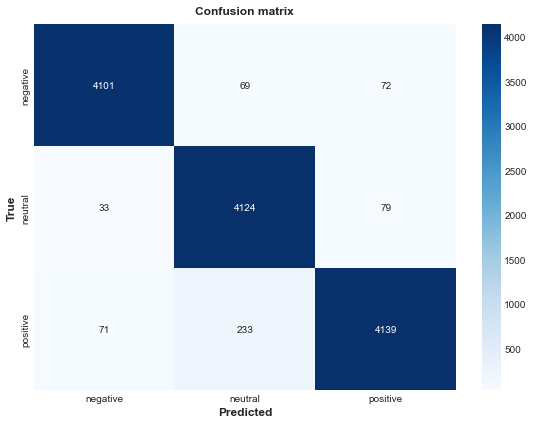

In [129]:
# Confusion Matrix
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

class_names = ['negative', 'neutral', 'positive'] # define class names

# create confusion matrix
cm = confusion_matrix(df2['true_sentiment'], df1['predicted_sentiment'], labels=class_names)

# plot confusion matrix
fig, ax = plt.subplots(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap="Blues", xticklabels=class_names, yticklabels=class_names, ax=ax)
plt.title('Confusion matrix')
plt.xlabel('Predicted')
plt.ylabel('True Labels')
plt.show()

In [130]:
from sklearn.metrics import classification_report

target_names = ['negative', 'neutral', 'positive']

print(classification_report(df2['true_sentiment'], df1['predicted_sentiment'], target_names=target_names))

              precision    recall  f1-score   support

    negative       0.98      0.97      0.97      4242
     neutral       0.93      0.97      0.95      4236
    positive       0.96      0.93      0.95      4443

    accuracy                           0.96     12921
   macro avg       0.96      0.96      0.96     12921
weighted avg       0.96      0.96      0.96     12921



### Prediction for LSTM

#### Positive

In [228]:
text_pred = 'I love the Paneer Tikka Masala at Aroma! It is lip-smackingly delicious!! Highly recommend this place for soulful Indian food'

In [187]:
text_pred

'I love the Paneer Tikka Masala at Aroma! It is lip-smackingly delicious!! Highly recommend this place for soulful Indian food'

In [229]:
text_new = []

text_new.append(remove_mult_spaces(filter_chars(clean_hashtags(strip_all_entities(strip_emoji(text_pred))))))

In [230]:
text_new

['i love the paneer tikka masala at aroma it is lipsmackingly delicious highly recommend this place for soulful indian food']

In [231]:
dp = pd.DataFrame(text_new, columns={'pred_text'})

In [232]:
dp

,pred_text
0,i love the paneer tikka masala at aroma it is ...


In [197]:
dp['pred_text']

0    i love the paneer tikka masala at aroma it is ...
Name: pred_text, dtype: object

In [233]:
dp['pred_text2'] = preprocess_text(dp['pred_text'])

In [234]:
dp

,pred_text,pred_text2
0,i love the paneer tikka masala at aroma it is ...,love paneer tikka masala aroma lipsmackingly d...


In [163]:
from nltk.tokenize import word_tokenize

In [235]:
# Tokenize the preprocessed text
dp['text_tok'] = dp['pred_text2'].apply(lambda x: word_tokenize(x))

In [236]:
dp

,pred_text,pred_text2,text_tok
0,i love the paneer tikka masala at aroma it is ...,love paneer tikka masala aroma lipsmackingly d...,"[love, paneer, tikka, masala, aroma, lipsmacki..."


In [248]:
dp['text_tok'].values

array([list(['love', 'paneer', 'tikka', 'masala', 'aroma', 'lipsmackingly', 'delicious', 'highly', 'recommend', 'place', 'soulful', 'indian', 'food'])],
      dtype=object)

In [267]:
# Train Word2Vec model on tokenized text
word2vec_single = Word2Vec(dp['text_tok'], vector_size=100, window=5, min_count=1)

In [268]:
# Convert tokenized text into numerical representation using Word2Vec
X_samp = []

for text in dp['text_tok']:
    X_samp.append([word2vec_model.wv[word] for word in text])

In [269]:
k = np.array(X_samp)

In [270]:
k

array([[[ 1.247147  , -1.9575493 , -1.6321298 , ...,  0.09750749,
         -1.0219525 , -0.65036714],
        [ 0.43778262, -1.4076947 , -0.01476904, ..., -1.1232215 ,
          0.8269578 , -0.79123217],
        [ 4.270456  , -3.1734529 ,  0.47809651, ...,  3.2370214 ,
         -1.4313118 , -1.9072114 ],
        ...,
        [ 0.05598523,  0.00954965, -0.02522183, ..., -0.15754305,
          0.05073415, -0.04733988],
        [-0.8766149 , -0.35300726,  0.617034  , ...,  1.8562243 ,
         -0.6425605 ,  0.03503467],
        [-1.8289692 ,  1.2376019 ,  1.6176775 , ..., -0.56565255,
         -0.25441566, -0.3430829 ]]], dtype=float32)

In [271]:
k.shape

(1, 13, 100)

In [272]:
X_samp = pad_sequences(k, maxlen=128, padding='post')

In [273]:
X_samp.shape

(1, 128, 100)

In [274]:
model1.predict(X_samp)

1/1 [==============================] - 0s 32ms/step


array([[1.0072580e-04, 4.0905643e-04, 9.9949014e-01]], dtype=float32)

In [275]:
pred = model1.predict(X_samp)

1/1 [==============================] - 0s 23ms/step


In [283]:
# get the index of the maximum value for each row
sentiment_idx = np.argmax(pred, axis=1)

# map the index to sentiment labels
sentiments = np.array(['negative', 'neutral', 'positive'])[sentiment_idx]

# create a dataframe with predicted_sentiment column
dfp = pd.DataFrame(pred, columns=['negative', 'neutral', 'positive'])
print(dfp)
print('\n')
print('Sentiment: ', sentiments[0])



   negative   neutral  positive
0  0.000101  0.000409   0.99949


Sentiment:  positive


#### Neutral

In [481]:
text_pred = 'India Garden is an average level restaurant'

In [482]:
text_pred

'India Garden is an average level restaurant'

In [483]:
text_new = []

text_new.append(remove_mult_spaces(filter_chars(clean_hashtags(strip_all_entities(strip_emoji(text_pred))))))

In [484]:
text_new

['india garden is an average level restaurant']

In [485]:
dp = pd.DataFrame(text_new, columns={'pred_text'})

In [486]:
dp

,pred_text
0,india garden is an average level restaurant


In [487]:
dp['pred_text']

0    india garden is an average level restaurant
Name: pred_text, dtype: object

In [488]:
dp['pred_text2'] = preprocess_text(dp['pred_text'])

In [489]:
dp

,pred_text,pred_text2
0,india garden is an average level restaurant,india garden average level restaurant


In [490]:
from nltk.tokenize import word_tokenize

In [491]:
# Tokenize the preprocessed text
dp['text_tok'] = dp['pred_text2'].apply(lambda x: word_tokenize(x))

In [492]:
dp

,pred_text,pred_text2,text_tok
0,india garden is an average level restaurant,india garden average level restaurant,"[india, garden, average, level, restaurant]"


In [493]:
dp['text_tok'].values

array([list(['india', 'garden', 'average', 'level', 'restaurant'])],
      dtype=object)

In [494]:
# Train Word2Vec model on tokenized text
word2vec_single = Word2Vec(dp['text_tok'], vector_size=100, window=5, min_count=1)

In [495]:
# Convert tokenized text into numerical representation using Word2Vec
X_samp = []

for text in dp['text_tok']:
    X_samp.append([word2vec_model.wv[word] for word in text])

In [496]:
k = np.array(X_samp)

In [497]:
k

array([[[-2.5268674e+00,  1.7095571e+00,  1.1830496e+00,  3.9650519e+00,
          9.2021897e-03, -8.9089447e-01,  8.9406443e-01,  1.2958944e+00,
          1.2522568e-01, -3.8197392e-01, -2.6019688e+00, -6.1196589e-01,
         -1.6044762e+00, -1.0711869e+00, -1.2680819e+00,  2.2295771e+00,
         -1.9386004e-01, -1.7128120e-01, -4.6004775e-01,  2.5387492e-02,
         -9.8341012e-01, -3.0993760e+00,  2.9012315e+00, -8.2257347e+00,
          1.8643434e+00,  5.1131892e-01,  1.9289745e-01, -1.2121975e+00,
         -2.0618503e+00,  1.9516684e+00,  1.1666243e+00,  1.1310385e+00,
         -6.9605607e-01, -1.0263127e+00,  2.6326013e+00,  1.1052951e+00,
          4.8210778e+00,  2.1008856e+00,  9.2802417e-01, -3.1877521e-02,
          1.1276830e+00,  1.2586937e+00, -1.4589915e-01, -3.2365385e-01,
         -7.6675482e-02,  2.1913503e-01, -1.8936612e-01, -2.7848878e+00,
          6.2010771e-01,  7.4261111e-01, -6.5277040e-02,  7.4202305e-01,
          2.5236123e+00,  4.9030657e+00,  7.9739690

In [498]:
k.shape

(1, 5, 100)

In [499]:
X_samp = pad_sequences(k, maxlen=128, padding='post')

In [500]:
X_samp.shape

(1, 128, 100)

In [501]:
model1.predict(X_samp)

1/1 [==============================] - 0s 31ms/step


array([[0.1241868 , 0.6801231 , 0.19569016]], dtype=float32)

In [502]:
pred = model1.predict(X_samp)

1/1 [==============================] - 0s 27ms/step


In [503]:
# get the index of the maximum value for each row
sentiment_idx = np.argmax(pred, axis=1)

# map the index to sentiment labels
sentiments = np.array(['negative', 'neutral', 'positive'])[sentiment_idx]

# create a dataframe with predicted_sentiment column
dfp = pd.DataFrame(pred, columns=['negative', 'neutral', 'positive'])
print(dfp)
print('\n')
print('Sentiment: ', sentiments[0])



   negative   neutral  positive
0  0.124187  0.680123   0.19569


Sentiment:  neutral


#### Negative

In [627]:
text_pred = 'The Saag Paneer at Delhi Palace tastes yuck! Worst experience!'

In [628]:
text_pred

'The Saag Paneer at Delhi Palace tastes yuck! Worst experience!'

In [629]:
text_new = []

text_new.append(remove_mult_spaces(filter_chars(clean_hashtags(strip_all_entities(strip_emoji(text_pred))))))

In [630]:
text_new

['the saag paneer at delhi palace tastes yuck worst experience']

In [631]:
dp = pd.DataFrame(text_new, columns={'pred_text'})

In [632]:
dp

,pred_text
0,the saag paneer at delhi palace tastes yuck wo...


In [633]:
dp['pred_text']

0    the saag paneer at delhi palace tastes yuck wo...
Name: pred_text, dtype: object

In [634]:
dp['pred_text2'] = preprocess_text(dp['pred_text'])

In [635]:
dp

,pred_text,pred_text2
0,the saag paneer at delhi palace tastes yuck wo...,saag paneer delhi palace taste yuck worst expe...


In [636]:
from nltk.tokenize import word_tokenize

In [637]:
# Tokenize the preprocessed text
dp['text_tok'] = dp['pred_text2'].apply(lambda x: word_tokenize(x))

In [638]:
dp

,pred_text,pred_text2,text_tok
0,the saag paneer at delhi palace tastes yuck wo...,saag paneer delhi palace taste yuck worst expe...,"[saag, paneer, delhi, palace, taste, yuck, wor..."


In [639]:
dp['text_tok'].values

array([list(['saag', 'paneer', 'delhi', 'palace', 'taste', 'yuck', 'worst', 'experience'])],
      dtype=object)

In [640]:
# Train Word2Vec model on tokenized text
word2vec_single = Word2Vec(dp['text_tok'], vector_size=100, window=5, min_count=1)

In [641]:
# Convert tokenized text into numerical representation using Word2Vec
X_samp = []

for text in dp['text_tok']:
    X_samp.append([word2vec_model.wv[word] for word in text])

In [642]:
k = np.array(X_samp)

In [643]:
k

array([[[ 2.09498930e+00, -1.12318873e+00, -3.52247536e-01,
          9.49031055e-01,  2.64257622e+00,  8.36238682e-01,
         -1.05562103e+00, -1.00369620e+00, -5.62855661e-01,
         -1.05313408e+00, -3.74270260e-01,  3.23468685e+00,
         -2.36311443e-02,  1.58666110e+00, -2.91750979e+00,
         -7.53881156e-01, -2.10507393e+00, -4.79958981e-01,
         -1.10205972e+00, -6.90679774e-02,  1.55126631e+00,
          1.18753874e+00, -1.48291290e-01,  8.36391866e-01,
          4.29294348e-01, -1.89660877e-01,  2.56637812e+00,
          1.41403210e+00, -3.33660722e-01, -2.72969460e+00,
         -2.03454971e+00,  2.23105359e+00,  3.04665875e+00,
         -3.67212206e-01,  2.70903826e+00, -3.21082878e+00,
         -2.43325067e+00,  5.42119443e-01,  9.45169330e-01,
         -2.17805669e-01, -1.32309890e+00,  3.49417043e+00,
          1.77633858e+00, -1.85443890e+00,  1.35240746e+00,
          1.67088187e+00, -5.75557053e-01,  8.05476189e-01,
          8.76431346e-01, -3.79271328e-0

In [644]:
k.shape

(1, 8, 100)

In [645]:
X_samp = pad_sequences(k, maxlen=128, padding='post')

In [646]:
X_samp.shape

(1, 128, 100)

In [647]:
model1.predict(X_samp)

1/1 [==============================] - 0s 21ms/step


array([[9.9920315e-01, 9.9460907e-05, 6.9747231e-04]], dtype=float32)

In [648]:
pred = model1.predict(X_samp)

1/1 [==============================] - 0s 24ms/step


In [649]:
# get the index of the maximum value for each row
sentiment_idx = np.argmax(pred, axis=1)

# map the index to sentiment labels
sentiments = np.array(['negative', 'neutral', 'positive'])[sentiment_idx]

# create a dataframe with predicted_sentiment column
dfp = pd.DataFrame(pred, columns=['negative', 'neutral', 'positive'])
print(dfp)
print('\n')
print('Sentiment: ', sentiments[0])



   negative   neutral  positive
0  0.999203  0.000099  0.000697


Sentiment:  negative


# GRU

In [655]:
# Two-layers of GRU with Dropout of 0.2
from tensorflow.keras.layers import Dense, Dropout, GRU

model3c = Sequential()

# This layer creates a GRU with 128 units.
model3c.add(GRU(128, input_shape=(128, 100), return_sequences=True))

# This layer adds dropout with a rate of 0.2.
model3c.add(Dropout(0.2))

# This layer creates a GRU with 64 units.
model3c.add(GRU(64))

# This layer adds dropout with a rate of 0.2.
model3c.add(Dropout(0.2))

# This layer creates a dense layer with 3 units and a softmax activation function.
model3c.add(Dense(3, activation='softmax'))

In [656]:
# Compile the model using cross-entropy loss and Adam optimizer
model3c.compile(loss='categorical_crossentropy', optimizer='RMSprop', metrics=['accuracy'])

In [657]:
# Train the model using the training set and validate it using the validation set
model3c.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=15, batch_size=32)

Epoch 1/15
3230/3230 [==============================] - 814s 251ms/step - loss: 0.7525 - accuracy: 0.6353 - val_loss: 0.4806 - val_accuracy: 0.8068
Epoch 2/15
3230/3230 [==============================] - 385s 119ms/step - loss: 0.3559 - accuracy: 0.8687 - val_loss: 0.2685 - val_accuracy: 0.9080
Epoch 3/15
3230/3230 [==============================] - 1332s 412ms/step - loss: 0.1934 - accuracy: 0.9373 - val_loss: 0.1808 - val_accuracy: 0.9455
Epoch 4/15
3230/3230 [==============================] - 407s 126ms/step - loss: 0.1262 - accuracy: 0.9620 - val_loss: 0.1429 - val_accuracy: 0.9582
Epoch 5/15
3230/3230 [==============================] - 1765s 547ms/step - loss: 0.0905 - accuracy: 0.9731 - val_loss: 0.1253 - val_accuracy: 0.9610
Epoch 6/15
3230/3230 [==============================] - 599s 186ms/step - loss: 0.0733 - accuracy: 0.9790 - val_loss: 0.1560 - val_accuracy: 0.9607
Epoch 7/15
 463/3230 [===>..........................] - ETA: 19:04 - loss: 0.0580 - accuracy: 0.9831

KeyboardInterrupt: 

In [658]:
model3c.save('model_twoGRUs_56kRows_maxlen128.h5')

In [659]:
# Evaluate the model performance on the testing set
loss, accuracy = model3c.evaluate(X_test, y_test, batch_size=32)
print("Testing Loss:", loss)
print("Testing Accuracy:", accuracy)

404/404 [==============================] - 24s 60ms/step - loss: 0.1374 - accuracy: 0.9659
Testing Loss: 0.13735851645469666
Testing Accuracy: 0.9658694863319397


In [660]:
# Evaluate the model performance on the training set
loss, accuracy = model3c.evaluate(X_train, y_train, batch_size=32)
print("Training Loss:", loss)
print("Training Accuracy:", accuracy)

3230/3230 [==============================] - 185s 57ms/step - loss: 0.0472 - accuracy: 0.9865
Training Loss: 0.04722069576382637
Training Accuracy: 0.9865034818649292


In [661]:
preds = model3c.predict(X_test)

404/404 [==============================] - 25s 58ms/step


In [662]:
preds.shape

(12921, 3)

In [663]:
preds[0:20]

array([[3.6389614e-04, 9.9739122e-01, 2.2447689e-03],
       [2.3052982e-05, 9.9900275e-01, 9.7411877e-04],
       [9.9980658e-01, 5.8458238e-05, 1.3502093e-04],
       [9.8919430e-05, 2.0826982e-04, 9.9969280e-01],
       [1.5515010e-05, 9.9942917e-01, 5.5526564e-04],
       [9.9988806e-01, 5.2401298e-05, 5.9476330e-05],
       [8.2092891e-05, 4.9901934e-04, 9.9941885e-01],
       [9.9956828e-01, 6.4932639e-05, 3.6676970e-04],
       [7.8537953e-05, 6.6918908e-03, 9.9322951e-01],
       [2.7336380e-03, 9.9478561e-01, 2.4806806e-03],
       [1.8593704e-04, 8.2004064e-04, 9.9899405e-01],
       [1.8559333e-05, 9.9800223e-01, 1.9791534e-03],
       [1.5980941e-04, 9.9738353e-01, 2.4567170e-03],
       [2.9385433e-04, 9.9680161e-01, 2.9045702e-03],
       [1.4822371e-03, 9.9359643e-01, 4.9213595e-03],
       [1.8447074e-04, 5.2079031e-05, 9.9976343e-01],
       [7.1422350e-05, 5.4663117e-03, 9.9446219e-01],
       [9.9995184e-01, 1.5755284e-05, 3.2425778e-05],
       [9.9994135e-01, 2.589

In [664]:
# Predicted Labels
import numpy as np

# assuming your array is called 'arr'
formatted_arr = np.array2string(preds[0:20], precision=8, separator=',', suppress_small=True)

print(formatted_arr)

[[0.0003639 ,0.9973912 ,0.00224477],
 [0.00002305,0.99900275,0.00097412],
 [0.9998066 ,0.00005846,0.00013502],
 [0.00009892,0.00020827,0.9996928 ],
 [0.00001552,0.99942917,0.00055527],
 [0.99988806,0.0000524 ,0.00005948],
 [0.00008209,0.00049902,0.99941885],
 [0.9995683 ,0.00006493,0.00036677],
 [0.00007854,0.00669189,0.9932295 ],
 [0.00273364,0.9947856 ,0.00248068],
 [0.00018594,0.00082004,0.99899405],
 [0.00001856,0.99800223,0.00197915],
 [0.00015981,0.99738353,0.00245672],
 [0.00029385,0.9968016 ,0.00290457],
 [0.00148224,0.99359643,0.00492136],
 [0.00018447,0.00005208,0.9997634 ],
 [0.00007142,0.00546631,0.9944622 ],
 [0.99995184,0.00001576,0.00003243],
 [0.99994135,0.0000259 ,0.00003276],
 [0.00010079,0.99483985,0.00505938]]


In [665]:
# True Labels
y_test[0:20]

array([[0., 1., 0.],
       [0., 1., 0.],
       [1., 0., 0.],
       [0., 0., 1.],
       [0., 1., 0.],
       [1., 0., 0.],
       [0., 0., 1.],
       [1., 0., 0.],
       [0., 0., 1.],
       [0., 1., 0.],
       [0., 0., 1.],
       [0., 1., 0.],
       [0., 1., 0.],
       [0., 1., 0.],
       [0., 1., 0.],
       [0., 0., 1.],
       [0., 0., 1.],
       [1., 0., 0.],
       [1., 0., 0.],
       [0., 1., 0.]], dtype=float32)

In [667]:
# get the index of the maximum value for each row
sentiment_idx = np.argmax(preds, axis=1)

# map the index to sentiment labels
sentiments = np.array(['negative', 'neutral', 'positive'])[sentiment_idx]

# create a dataframe with predicted_sentiment column
df1 = pd.DataFrame(preds, columns=['negative', 'neutral', 'positive'])
df1['predicted_sentiment'] = sentiments

print(df1)

       negative   neutral  positive predicted_sentiment
0      0.000364  0.997391  0.002245             neutral
1      0.000023  0.999003  0.000974             neutral
2      0.999807  0.000058  0.000135            negative
3      0.000099  0.000208  0.999693            positive
4      0.000016  0.999429  0.000555             neutral
...         ...       ...       ...                 ...
12916  0.999956  0.000017  0.000027            negative
12917  0.000021  0.998757  0.001222             neutral
12918  0.999672  0.000023  0.000304            negative
12919  0.000029  0.998499  0.001472             neutral
12920  0.000053  0.998081  0.001866             neutral

[12921 rows x 4 columns]


In [668]:
# get the index of the maximum value for each row
sentiment_idx = np.argmax(y_test, axis=1)

# map the index to sentiment labels
sentiments = np.array(['negative', 'neutral', 'positive'])[sentiment_idx]

# create a dataframe with predicted_sentiment column
df2 = pd.DataFrame(y_test, columns=['negative', 'neutral', 'positive'])
df2['true_sentiment'] = sentiments

print(df2)

       negative  neutral  positive true_sentiment
0           0.0      1.0       0.0        neutral
1           0.0      1.0       0.0        neutral
2           1.0      0.0       0.0       negative
3           0.0      0.0       1.0       positive
4           0.0      1.0       0.0        neutral
...         ...      ...       ...            ...
12916       1.0      0.0       0.0       negative
12917       0.0      1.0       0.0        neutral
12918       1.0      0.0       0.0       negative
12919       0.0      1.0       0.0        neutral
12920       0.0      1.0       0.0        neutral

[12921 rows x 4 columns]


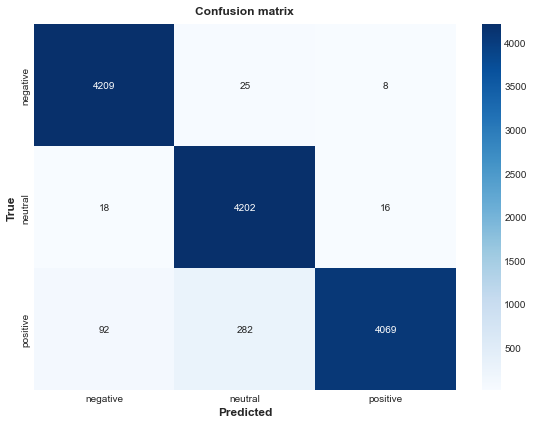

In [669]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

class_names = ['negative', 'neutral', 'positive'] # define class names

# create confusion matrix
cm = confusion_matrix(df2['true_sentiment'], df1['predicted_sentiment'], labels=class_names)

# plot confusion matrix
fig, ax = plt.subplots(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap="Blues", xticklabels=class_names, yticklabels=class_names, ax=ax)
plt.title('Confusion matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

In [670]:
from sklearn.metrics import classification_report

target_names = ['negative', 'neutral', 'positive']

print(classification_report(df2['true_sentiment'], df1['predicted_sentiment'], target_names=target_names))

              precision    recall  f1-score   support

    negative       0.97      0.99      0.98      4242
     neutral       0.93      0.99      0.96      4236
    positive       0.99      0.92      0.95      4443

    accuracy                           0.97     12921
   macro avg       0.97      0.97      0.97     12921
weighted avg       0.97      0.97      0.97     12921



# Bi-Directional LSTM

In [671]:
# Define the deep learning architecture (Bi-LSTM model with 0.2 Dropout)
from tensorflow.keras.layers import Dense, Dropout, Bidirectional
model3b = Sequential()
model3b.add(Bidirectional(LSTM(128), input_shape=(128, 100)))
model3b.add(Dropout(0.2))
model3b.add(Dense(3, activation='softmax'))

In [672]:
# Compile the model using cross-entropy loss and Adam optimizer
model3b.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

In [673]:
# Train the model using the training set and validate it using the validation set
model3b.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=5, batch_size=32)

Epoch 1/5
3230/3230 [==============================] - 638s 196ms/step - loss: 0.4840 - accuracy: 0.7993 - val_loss: 0.3337 - val_accuracy: 0.8757
Epoch 2/5
3230/3230 [==============================] - 615s 190ms/step - loss: 0.2373 - accuracy: 0.9161 - val_loss: 0.1881 - val_accuracy: 0.9396
Epoch 3/5
3230/3230 [==============================] - 2632s 815ms/step - loss: 0.1324 - accuracy: 0.9563 - val_loss: 0.1384 - val_accuracy: 0.9592
Epoch 4/5
3230/3230 [==============================] - 2379s 737ms/step - loss: 0.0832 - accuracy: 0.9734 - val_loss: 0.1068 - val_accuracy: 0.9677
Epoch 5/5
3230/3230 [==============================] - 2060s 638ms/step - loss: 0.0703 - accuracy: 0.9771 - val_loss: 0.1050 - val_accuracy: 0.9709


In [687]:
model3b.save('model_BiLSTM_56kRows_maxlen128.h5')

In [675]:
# Evaluate the model performance on the testing set
loss, accuracy = model3b.evaluate(X_test, y_test, batch_size=32)
print("Testing Loss:", loss)
print("Testing Accuracy:", accuracy)

404/404 [==============================] - 45s 112ms/step - loss: 0.0928 - accuracy: 0.9737
Testing Loss: 0.09275488555431366
Testing Accuracy: 0.9736862182617188


In [701]:
# Evaluate the model performance on the training set
loss, accuracy = model3b.evaluate(X_train, y_train, batch_size=32)
print("Training Loss:", loss)
print("Training Accuracy:", accuracy)

3230/3230 [==============================] - 237s 73ms/step - loss: 0.0326 - accuracy: 0.9910
Training Loss: 0.03262244164943695
Training Accuracy: 0.9909926652908325


In [678]:
preds = model3b.predict(X_test)

404/404 [==============================] - 46s 111ms/step


In [679]:
preds.shape

(12921, 3)

In [680]:
preds[0:20]

array([[8.49742035e-04, 9.97900128e-01, 1.25011173e-03],
       [3.77890792e-05, 9.92774844e-01, 7.18742004e-03],
       [9.99996066e-01, 1.03243005e-08, 3.89139313e-06],
       [1.28063277e-07, 3.87899178e-07, 9.99999523e-01],
       [8.66449135e-09, 9.99920726e-01, 7.92663632e-05],
       [9.18494940e-01, 7.84372464e-02, 3.06774490e-03],
       [1.12777052e-04, 7.59781862e-04, 9.99127448e-01],
       [7.60888040e-01, 9.75392200e-03, 2.29357958e-01],
       [5.45987348e-07, 5.90872478e-05, 9.99940395e-01],
       [2.94958688e-02, 9.63097274e-01, 7.40689179e-03],
       [1.39378329e-07, 1.04747940e-07, 9.99999762e-01],
       [1.81329830e-04, 9.97360289e-01, 2.45833769e-03],
       [4.36046132e-04, 9.96376336e-01, 3.18765128e-03],
       [1.32076815e-02, 9.17556226e-01, 6.92361072e-02],
       [5.47030475e-04, 9.97768283e-01, 1.68474915e-03],
       [6.12212614e-10, 2.96521918e-10, 1.00000000e+00],
       [7.00321980e-05, 4.54752881e-04, 9.99475181e-01],
       [9.99999881e-01, 3.61496

In [681]:
# Predicted Labels
import numpy as np

# assuming your array is called 'arr'
formatted_arr = np.array2string(preds[0:20], precision=8, separator=',', suppress_small=True)

print(formatted_arr)

[[0.00084974,0.9979001 ,0.00125011],
 [0.00003779,0.99277484,0.00718742],
 [0.99999607,0.00000001,0.00000389],
 [0.00000013,0.00000039,0.9999995 ],
 [0.00000001,0.9999207 ,0.00007927],
 [0.91849494,0.07843725,0.00306774],
 [0.00011278,0.00075978,0.99912745],
 [0.76088804,0.00975392,0.22935796],
 [0.00000055,0.00005909,0.9999404 ],
 [0.02949587,0.9630973 ,0.00740689],
 [0.00000014,0.0000001 ,0.99999976],
 [0.00018133,0.9973603 ,0.00245834],
 [0.00043605,0.99637634,0.00318765],
 [0.01320768,0.9175562 ,0.06923611],
 [0.00054703,0.9977683 ,0.00168475],
 [0.        ,0.        ,1.        ],
 [0.00007003,0.00045475,0.9994752 ],
 [0.9999999 ,0.        ,0.00000016],
 [0.99999976,0.00000002,0.00000029],
 [0.00001252,0.99771833,0.00226921]]


In [682]:
# True Labels
y_test[0:20]

array([[0., 1., 0.],
       [0., 1., 0.],
       [1., 0., 0.],
       [0., 0., 1.],
       [0., 1., 0.],
       [1., 0., 0.],
       [0., 0., 1.],
       [1., 0., 0.],
       [0., 0., 1.],
       [0., 1., 0.],
       [0., 0., 1.],
       [0., 1., 0.],
       [0., 1., 0.],
       [0., 1., 0.],
       [0., 1., 0.],
       [0., 0., 1.],
       [0., 0., 1.],
       [1., 0., 0.],
       [1., 0., 0.],
       [0., 1., 0.]], dtype=float32)

In [683]:
# get the index of the maximum value for each row
sentiment_idx = np.argmax(preds, axis=1)

# map the index to sentiment labels
sentiments = np.array(['negative', 'neutral', 'positive'])[sentiment_idx]

# create a dataframe with predicted_sentiment column
df1 = pd.DataFrame(preds, columns=['negative', 'neutral', 'positive'])
df1['predicted_sentiment'] = sentiments

print(df1)

           negative       neutral  positive predicted_sentiment
0      8.497420e-04  9.979001e-01  0.001250             neutral
1      3.778908e-05  9.927748e-01  0.007187             neutral
2      9.999961e-01  1.032430e-08  0.000004            negative
3      1.280633e-07  3.878992e-07  1.000000            positive
4      8.664491e-09  9.999207e-01  0.000079             neutral
...             ...           ...       ...                 ...
12916  9.986588e-01  2.386614e-04  0.001103            negative
12917  3.449062e-05  9.678671e-01  0.032098             neutral
12918  9.996533e-01  1.330172e-05  0.000333            negative
12919  6.809811e-06  9.879661e-01  0.012027             neutral
12920  7.237684e-04  9.904027e-01  0.008874             neutral

[12921 rows x 4 columns]


In [684]:
# get the index of the maximum value for each row
sentiment_idx = np.argmax(y_test, axis=1)

# map the index to sentiment labels
sentiments = np.array(['negative', 'neutral', 'positive'])[sentiment_idx]

# create a dataframe with predicted_sentiment column
df2 = pd.DataFrame(y_test, columns=['negative', 'neutral', 'positive'])
df2['true_sentiment'] = sentiments

print(df2)

       negative  neutral  positive true_sentiment
0           0.0      1.0       0.0        neutral
1           0.0      1.0       0.0        neutral
2           1.0      0.0       0.0       negative
3           0.0      0.0       1.0       positive
4           0.0      1.0       0.0        neutral
...         ...      ...       ...            ...
12916       1.0      0.0       0.0       negative
12917       0.0      1.0       0.0        neutral
12918       1.0      0.0       0.0       negative
12919       0.0      1.0       0.0        neutral
12920       0.0      1.0       0.0        neutral

[12921 rows x 4 columns]


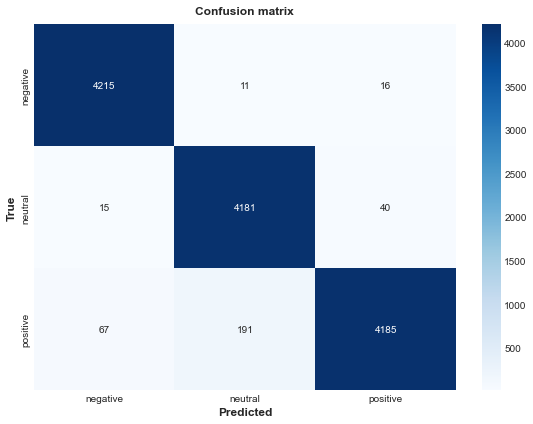

In [685]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

class_names = ['negative', 'neutral', 'positive'] # define class names

# create confusion matrix
cm = confusion_matrix(df2['true_sentiment'], df1['predicted_sentiment'], labels=class_names)

# plot confusion matrix
fig, ax = plt.subplots(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap="Blues", xticklabels=class_names, yticklabels=class_names, ax=ax)
plt.title('Confusion matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

In [686]:
from sklearn.metrics import classification_report

target_names = ['negative', 'neutral', 'positive']

print(classification_report(df2['true_sentiment'], df1['predicted_sentiment'], target_names=target_names))

              precision    recall  f1-score   support

    negative       0.98      0.99      0.99      4242
     neutral       0.95      0.99      0.97      4236
    positive       0.99      0.94      0.96      4443

    accuracy                           0.97     12921
   macro avg       0.97      0.97      0.97     12921
weighted avg       0.97      0.97      0.97     12921



### Prediction for Bi-LSTM

#### Positive

In [807]:
text_pred = """I love the Paneer Tikka Masala at Aroma! It is lip-smackingly delicious!! Highly recommend this place 
               for soulful Indian food"""

In [808]:
text_pred

'I love the Paneer Tikka Masala at Aroma! It is lip-smackingly delicious!! Highly recommend this place \n               for soulful Indian food'

In [809]:
text_new = []

text_new.append(remove_mult_spaces(filter_chars(clean_hashtags(strip_all_entities(strip_emoji(text_pred))))))

In [810]:
text_new

['i love the paneer tikka masala at aroma it is lipsmackingly delicious highly recommend this place for soulful indian food']

In [724]:
dp = pd.DataFrame(text_new, columns={'pred_text'})

In [725]:
dp

,pred_text
0,i love the paneer tikka masala at aroma it is ...


In [726]:
dp['pred_text']

0    i love the paneer tikka masala at aroma it is ...
Name: pred_text, dtype: object

In [727]:
dp['pred_text2'] = preprocess_text(dp['pred_text'])

In [728]:
dp

,pred_text,pred_text2
0,i love the paneer tikka masala at aroma it is ...,love paneer tikka masala aroma lipsmackingly d...


In [729]:
from nltk.tokenize import word_tokenize

In [730]:
# Tokenize the preprocessed text
dp['text_tok'] = dp['pred_text2'].apply(lambda x: word_tokenize(x))

In [731]:
dp

,pred_text,pred_text2,text_tok
0,i love the paneer tikka masala at aroma it is ...,love paneer tikka masala aroma lipsmackingly d...,"[love, paneer, tikka, masala, aroma, lipsmacki..."


In [732]:
dp['text_tok'].values

array([list(['love', 'paneer', 'tikka', 'masala', 'aroma', 'lipsmackingly', 'delicious', 'highly', 'recommend', 'place', 'soulful', 'indian', 'food'])],
      dtype=object)

In [733]:
# Train Word2Vec model on tokenized text
word2vec_single = Word2Vec(dp['text_tok'], vector_size=100, window=5, min_count=1)

In [734]:
# Convert tokenized text into numerical representation using Word2Vec
X_samp = []

for text in dp['text_tok']:
    X_samp.append([word2vec_model.wv[word] for word in text])

In [735]:
k = np.array(X_samp)

In [736]:
k

array([[[ 1.247147  , -1.9575493 , -1.6321298 , ...,  0.09750749,
         -1.0219525 , -0.65036714],
        [ 0.43778262, -1.4076947 , -0.01476904, ..., -1.1232215 ,
          0.8269578 , -0.79123217],
        [ 4.270456  , -3.1734529 ,  0.47809651, ...,  3.2370214 ,
         -1.4313118 , -1.9072114 ],
        ...,
        [ 0.05598523,  0.00954965, -0.02522183, ..., -0.15754305,
          0.05073415, -0.04733988],
        [-0.8766149 , -0.35300726,  0.617034  , ...,  1.8562243 ,
         -0.6425605 ,  0.03503467],
        [-1.8289692 ,  1.2376019 ,  1.6176775 , ..., -0.56565255,
         -0.25441566, -0.3430829 ]]], dtype=float32)

In [737]:
k.shape

(1, 13, 100)

In [738]:
X_samp = pad_sequences(k, maxlen=128, padding='post')

In [739]:
X_samp.shape

(1, 128, 100)

In [740]:
model1.predict(X_samp)

1/1 [==============================] - 0s 40ms/step


array([[1.0072580e-04, 4.0905643e-04, 9.9949014e-01]], dtype=float32)

In [741]:
pred = model1.predict(X_samp)

1/1 [==============================] - 0s 31ms/step


In [742]:
# get the index of the maximum value for each row
sentiment_idx = np.argmax(pred, axis=1)

# map the index to sentiment labels
sentiments = np.array(['negative', 'neutral', 'positive'])[sentiment_idx]

# create a dataframe with predicted_sentiment column
dfp = pd.DataFrame(pred, columns=['negative', 'neutral', 'positive'])
print(dfp)
print('\n')
print('Sentiment: ', sentiments[0])

   negative   neutral  positive
0  0.000101  0.000409   0.99949


Sentiment:  positive


#### Neutral

In [481]:
text_pred = 'India Garden is an average level restaurant'

In [811]:
text_pred = """We had dinner at India Garden. The food was okay-ish. Some dishes were good, while some where not. 
               Also, average customer service. I would rate it mid-level. Can try it out once!"""

In [812]:
text_pred

'We had dinner at India Garden. The food was okay-ish. Some dishes were good, while some where not. \n               Also, average customer service. I would rate it mid-level. Can try it out once!'

In [813]:
text_new = []

text_new.append(remove_mult_spaces(filter_chars(clean_hashtags(strip_all_entities(strip_emoji(text_pred))))))

In [814]:
text_new

['we had dinner at india garden the food was okayish some dishes were good while some where not also average customer service i would rate it midlevel can try it out once']

In [767]:
dp = pd.DataFrame(text_new, columns={'pred_text'})

In [768]:
dp

,pred_text
0,we had dinner at india garden the food was oka...


In [769]:
dp['pred_text']

0    we had dinner at india garden the food was oka...
Name: pred_text, dtype: object

In [770]:
dp['pred_text2'] = preprocess_text(dp['pred_text'])

In [753]:
dp

,pred_text,pred_text2
0,we had dinner at india garden the food was oka...,dinner india garden food okayish dish good als...


In [490]:
from nltk.tokenize import word_tokenize

In [771]:
# Tokenize the preprocessed text
dp['text_tok'] = dp['pred_text2'].apply(lambda x: word_tokenize(x))

In [755]:
dp

,pred_text,pred_text2,text_tok
0,we had dinner at india garden the food was oka...,dinner india garden food okayish dish good als...,"[dinner, india, garden, food, okayish, dish, g..."


In [772]:
dp['text_tok'].values

array([list(['dinner', 'india', 'garden', 'food', 'okayish', 'dish', 'good', 'also', 'average', 'customer', 'service', 'would', 'rate', 'midlevel', 'try'])],
      dtype=object)

In [773]:
# Train Word2Vec model on tokenized text
word2vec_single = Word2Vec(dp['text_tok'], vector_size=100, window=5, min_count=1)

In [774]:
# Convert tokenized text into numerical representation using Word2Vec
X_samp = []

for text in dp['text_tok']:
    X_samp.append([word2vec_model.wv[word] for word in text])

In [775]:
k = np.array(X_samp)

In [776]:
k

array([[[ 2.503429  ,  2.3664212 ,  0.14466627, ...,  1.1002451 ,
          1.1553663 , -1.4277446 ],
        [-2.5268674 ,  1.709557  ,  1.1830496 , ...,  2.1643085 ,
         -0.41574243,  1.1567957 ],
        [ 0.826602  ,  0.10972385,  0.8321019 , ...,  0.05369699,
         -0.9084357 , -0.71772003],
        ...,
        [ 2.3323803 , -0.61543363, -1.1370378 , ...,  0.5375115 ,
         -1.7151251 ,  1.8454214 ],
        [-0.01401444, -0.05415529, -0.06783043, ...,  0.00826079,
          0.15929055, -0.03349161],
        [ 1.9624386 , -2.7770739 , -2.2789164 , ..., -1.9654448 ,
          3.3906422 ,  0.55004483]]], dtype=float32)

In [498]:
k.shape

(1, 5, 100)

In [777]:
X_samp = pad_sequences(k, maxlen=128, padding='post')

In [778]:
X_samp.shape

(1, 128, 100)

In [779]:
model1.predict(X_samp)

1/1 [==============================] - 0s 21ms/step


array([[0.00108579, 0.9891289 , 0.0097854 ]], dtype=float32)

In [780]:
pred = model1.predict(X_samp)

1/1 [==============================] - 0s 32ms/step


In [781]:
# get the index of the maximum value for each row
sentiment_idx = np.argmax(pred, axis=1)

# map the index to sentiment labels
sentiments = np.array(['negative', 'neutral', 'positive'])[sentiment_idx]

# create a dataframe with predicted_sentiment column
dfp = pd.DataFrame(pred, columns=['negative', 'neutral', 'positive'])
print(dfp)
print('\n')
print('Sentiment: ', sentiments[0])

   negative   neutral  positive
0  0.001086  0.989129  0.009785


Sentiment:  neutral


#### Negative

In [782]:
text_pred = 'The Saag Paneer at Delhi Palace tastes yuck! Worst experience!'

In [784]:
text_pred

'The Saag Paneer at Delhi Palace tastes yuck! Worst experience!'

In [785]:
text_new = []

text_new.append(remove_mult_spaces(filter_chars(clean_hashtags(strip_all_entities(strip_emoji(text_pred))))))

In [786]:
text_new

['the saag paneer at delhi palace tastes yuck worst experience']

In [787]:
dp = pd.DataFrame(text_new, columns={'pred_text'})

In [788]:
dp

,pred_text
0,the saag paneer at delhi palace tastes yuck wo...


In [789]:
dp['pred_text']

0    the saag paneer at delhi palace tastes yuck wo...
Name: pred_text, dtype: object

In [790]:
dp['pred_text2'] = preprocess_text(dp['pred_text'])

In [791]:
dp

,pred_text,pred_text2
0,the saag paneer at delhi palace tastes yuck wo...,saag paneer delhi palace taste yuck worst expe...


In [792]:
from nltk.tokenize import word_tokenize

In [793]:
# Tokenize the preprocessed text
dp['text_tok'] = dp['pred_text2'].apply(lambda x: word_tokenize(x))

In [794]:
dp

,pred_text,pred_text2,text_tok
0,the saag paneer at delhi palace tastes yuck wo...,saag paneer delhi palace taste yuck worst expe...,"[saag, paneer, delhi, palace, taste, yuck, wor..."


In [795]:
dp['text_tok'].values

array([list(['saag', 'paneer', 'delhi', 'palace', 'taste', 'yuck', 'worst', 'experience'])],
      dtype=object)

In [796]:
# Train Word2Vec model on tokenized text
word2vec_single = Word2Vec(dp['text_tok'], vector_size=100, window=5, min_count=1)

In [797]:
# Convert tokenized text into numerical representation using Word2Vec
X_samp = []

for text in dp['text_tok']:
    X_samp.append([word2vec_model.wv[word] for word in text])

In [798]:
k = np.array(X_samp)

In [799]:
k

array([[[ 2.09498930e+00, -1.12318873e+00, -3.52247536e-01,
          9.49031055e-01,  2.64257622e+00,  8.36238682e-01,
         -1.05562103e+00, -1.00369620e+00, -5.62855661e-01,
         -1.05313408e+00, -3.74270260e-01,  3.23468685e+00,
         -2.36311443e-02,  1.58666110e+00, -2.91750979e+00,
         -7.53881156e-01, -2.10507393e+00, -4.79958981e-01,
         -1.10205972e+00, -6.90679774e-02,  1.55126631e+00,
          1.18753874e+00, -1.48291290e-01,  8.36391866e-01,
          4.29294348e-01, -1.89660877e-01,  2.56637812e+00,
          1.41403210e+00, -3.33660722e-01, -2.72969460e+00,
         -2.03454971e+00,  2.23105359e+00,  3.04665875e+00,
         -3.67212206e-01,  2.70903826e+00, -3.21082878e+00,
         -2.43325067e+00,  5.42119443e-01,  9.45169330e-01,
         -2.17805669e-01, -1.32309890e+00,  3.49417043e+00,
          1.77633858e+00, -1.85443890e+00,  1.35240746e+00,
          1.67088187e+00, -5.75557053e-01,  8.05476189e-01,
          8.76431346e-01, -3.79271328e-0

In [800]:
k.shape

(1, 8, 100)

In [801]:
X_samp = pad_sequences(k, maxlen=128, padding='post')

In [802]:
X_samp.shape

(1, 128, 100)

In [803]:
model1.predict(X_samp)

1/1 [==============================] - 0s 27ms/step


array([[9.9920315e-01, 9.9460907e-05, 6.9747231e-04]], dtype=float32)

In [804]:
pred = model1.predict(X_samp)

1/1 [==============================] - 0s 22ms/step


In [806]:
# get the index of the maximum value for each row
sentiment_idx = np.argmax(pred, axis=1)

# map the index to sentiment labels
sentiments = np.array(['negative', 'neutral', 'positive'])[sentiment_idx]

# create a dataframe with predicted_sentiment column
dfp = pd.DataFrame(pred, columns=['negative', 'neutral', 'positive'])
print(dfp)
print('\n')
print('Sentiment: ', sentiments[0])

   negative   neutral  positive
0  0.999203  0.000099  0.000697


Sentiment:  negative


# Vanilla RNN

In [691]:
# Two layers of Simple RNN with 0.2 Dropout
from tensorflow.keras.layers import Dense, Dropout, SimpleRNN

model_rnn = Sequential()

# This layer creates a SimpleRNN with 128 units.
model_rnn.add(SimpleRNN(128, input_shape=(128, 100), return_sequences=True))

# This layer adds dropout with a rate of 0.2.
model_rnn.add(Dropout(0.2))

# This layer creates another SimpleRNN layer with 64 units.
model_rnn.add(SimpleRNN(64))

# This layer adds dropout with a rate of 0.2.
model_rnn.add(Dropout(0.2))

# This layer creates a dense layer with 3 units and a softmax activation function.
model_rnn.add(Dense(3, activation='softmax'))

In [692]:
# # Compile the model using cross-entropy loss and Adam optimizer
# from tensorflow.keras.optimizers import Adam

# # Create an instance of the Adam optimizer with learning rate 0.01 and weight decay 2e-5
# adam = Adam(learning_rate=0.01, weight_decay=2e-5)

# Compile the model using cross-entropy loss and the custom Adam optimizer
model_rnn.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

In [695]:
# Train the model using the training set and validate it using the validation set
model_rnn.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=20, batch_size=32)

Epoch 1/20
3230/3230 [==============================] - 170s 53ms/step - loss: 1.0990 - accuracy: 0.3530 - val_loss: 1.0972 - val_accuracy: 0.3471
Epoch 2/20
3230/3230 [==============================] - 171s 53ms/step - loss: 1.0934 - accuracy: 0.3578 - val_loss: 1.0880 - val_accuracy: 0.3575
Epoch 3/20
3230/3230 [==============================] - 182s 56ms/step - loss: 1.0745 - accuracy: 0.4034 - val_loss: 1.0565 - val_accuracy: 0.4519
Epoch 4/20
3230/3230 [==============================] - 3751s 1s/step - loss: 1.0636 - accuracy: 0.4407 - val_loss: 1.0681 - val_accuracy: 0.4365
Epoch 5/20
3230/3230 [==============================] - 205s 63ms/step - loss: 1.0774 - accuracy: 0.4123 - val_loss: 1.0819 - val_accuracy: 0.4149
Epoch 6/20
3230/3230 [==============================] - 192s 60ms/step - loss: 1.0557 - accuracy: 0.4378 - val_loss: 1.0370 - val_accuracy: 0.4808
Epoch 7/20
3230/3230 [==============================] - 186s 58ms/step - loss: 1.0401 - accuracy: 0.4688 - val_loss: 1.

In [702]:
# Evaluate the model performance on the testing set
loss, accuracy = model_rnn.evaluate(X_test, y_test, batch_size=32)
print("Testing Loss:", loss)
print("Testing Accuracy:", accuracy)

404/404 [==============================] - 7s 17ms/step - loss: 1.0021 - accuracy: 0.4984
Testing Loss: 1.0021047592163086
Testing Accuracy: 0.49841344356536865


In [703]:
# Evaluate the model performance on the training set
loss, accuracy = model_rnn.evaluate(X_train, y_train, batch_size=32)
print("Training Loss:", loss)
print("Training Accuracy:", accuracy)

3230/3230 [==============================] - 50s 15ms/step - loss: 1.0016 - accuracy: 0.4999
Training Loss: 1.0016433000564575
Training Accuracy: 0.49989357590675354


In [704]:
preds = model_rnn.predict(X_test)

404/404 [==============================] - 6s 14ms/step


In [705]:
preds.shape

(12921, 3)

In [706]:
preds[0:20]

array([[0.47365537, 0.3423805 , 0.18396415],
       [0.47365537, 0.3423805 , 0.18396415],
       [0.47365537, 0.3423805 , 0.18396415],
       [0.10905834, 0.26859543, 0.6223463 ],
       [0.47365543, 0.34238055, 0.18396413],
       [0.47365537, 0.3423805 , 0.18396415],
       [0.10905835, 0.2685954 , 0.6223462 ],
       [0.47365537, 0.34238043, 0.18396415],
       [0.10905834, 0.26859543, 0.6223463 ],
       [0.24582015, 0.3295352 , 0.4246447 ],
       [0.2725198 , 0.37358332, 0.3538969 ],
       [0.28268337, 0.38723105, 0.33008552],
       [0.29495478, 0.3643353 , 0.34070995],
       [0.47365537, 0.3423805 , 0.18396415],
       [0.10905835, 0.26859543, 0.6223462 ],
       [0.10905834, 0.26859543, 0.6223463 ],
       [0.23240943, 0.35543007, 0.41216052],
       [0.47365537, 0.3423805 , 0.18396415],
       [0.47365537, 0.3423805 , 0.18396415],
       [0.27073002, 0.33855674, 0.3907132 ]], dtype=float32)

In [707]:
# Predicted Labels
import numpy as np

# assuming your array is called 'arr'
formatted_arr = np.array2string(preds[0:20], precision=8, separator=',', suppress_small=True)

print(formatted_arr)

[[0.47365537,0.3423805 ,0.18396415],
 [0.47365537,0.3423805 ,0.18396415],
 [0.47365537,0.3423805 ,0.18396415],
 [0.10905834,0.26859543,0.6223463 ],
 [0.47365543,0.34238055,0.18396413],
 [0.47365537,0.3423805 ,0.18396415],
 [0.10905835,0.2685954 ,0.6223462 ],
 [0.47365537,0.34238043,0.18396415],
 [0.10905834,0.26859543,0.6223463 ],
 [0.24582015,0.3295352 ,0.4246447 ],
 [0.2725198 ,0.37358332,0.3538969 ],
 [0.28268337,0.38723105,0.33008552],
 [0.29495478,0.3643353 ,0.34070995],
 [0.47365537,0.3423805 ,0.18396415],
 [0.10905835,0.26859543,0.6223462 ],
 [0.10905834,0.26859543,0.6223463 ],
 [0.23240943,0.35543007,0.41216052],
 [0.47365537,0.3423805 ,0.18396415],
 [0.47365537,0.3423805 ,0.18396415],
 [0.27073002,0.33855674,0.3907132 ]]


In [708]:
# True Labels
y_test[0:20]

array([[0., 1., 0.],
       [0., 1., 0.],
       [1., 0., 0.],
       [0., 0., 1.],
       [0., 1., 0.],
       [1., 0., 0.],
       [0., 0., 1.],
       [1., 0., 0.],
       [0., 0., 1.],
       [0., 1., 0.],
       [0., 0., 1.],
       [0., 1., 0.],
       [0., 1., 0.],
       [0., 1., 0.],
       [0., 1., 0.],
       [0., 0., 1.],
       [0., 0., 1.],
       [1., 0., 0.],
       [1., 0., 0.],
       [0., 1., 0.]], dtype=float32)

In [709]:
# get the index of the maximum value for each row
sentiment_idx = np.argmax(preds, axis=1)

# map the index to sentiment labels
sentiments = np.array(['negative', 'neutral', 'positive'])[sentiment_idx]

# create a dataframe with predicted_sentiment column
df1 = pd.DataFrame(preds, columns=['negative', 'neutral', 'positive'])
df1['predicted_sentiment'] = sentiments

print(df1)

       negative   neutral  positive predicted_sentiment
0      0.473655  0.342380  0.183964            negative
1      0.473655  0.342380  0.183964            negative
2      0.473655  0.342380  0.183964            negative
3      0.109058  0.268595  0.622346            positive
4      0.473655  0.342381  0.183964            negative
...         ...       ...       ...                 ...
12916  0.473655  0.342381  0.183964            negative
12917  0.473655  0.342380  0.183964            negative
12918  0.473655  0.342380  0.183964            negative
12919  0.109058  0.268595  0.622346            positive
12920  0.473655  0.342380  0.183964            negative

[12921 rows x 4 columns]


In [710]:
# get the index of the maximum value for each row
sentiment_idx = np.argmax(y_test, axis=1)

# map the index to sentiment labels
sentiments = np.array(['negative', 'neutral', 'positive'])[sentiment_idx]

# create a dataframe with predicted_sentiment column
df2 = pd.DataFrame(y_test, columns=['negative', 'neutral', 'positive'])
df2['true_sentiment'] = sentiments

print(df2)

       negative  neutral  positive true_sentiment
0           0.0      1.0       0.0        neutral
1           0.0      1.0       0.0        neutral
2           1.0      0.0       0.0       negative
3           0.0      0.0       1.0       positive
4           0.0      1.0       0.0        neutral
...         ...      ...       ...            ...
12916       1.0      0.0       0.0       negative
12917       0.0      1.0       0.0        neutral
12918       1.0      0.0       0.0       negative
12919       0.0      1.0       0.0        neutral
12920       0.0      1.0       0.0        neutral

[12921 rows x 4 columns]


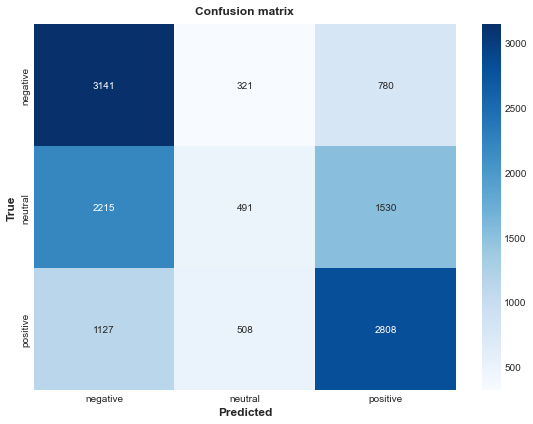

In [711]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

class_names = ['negative', 'neutral', 'positive'] # define class names

# create confusion matrix
cm = confusion_matrix(df2['true_sentiment'], df1['predicted_sentiment'], labels=class_names)

# plot confusion matrix
fig, ax = plt.subplots(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap="Blues", xticklabels=class_names, yticklabels=class_names, ax=ax)
plt.title('Confusion matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

In [712]:
from sklearn.metrics import classification_report

target_names = ['negative', 'neutral', 'positive']

print(classification_report(df2['true_sentiment'], df1['predicted_sentiment'], target_names=target_names))

              precision    recall  f1-score   support

    negative       0.48      0.74      0.59      4242
     neutral       0.37      0.12      0.18      4236
    positive       0.55      0.63      0.59      4443

    accuracy                           0.50     12921
   macro avg       0.47      0.50      0.45     12921
weighted avg       0.47      0.50      0.45     12921



# CNN Model

In [717]:
# 4 layered CNN model with 0.2 dropout
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Flatten

model_cnn = Sequential()

# This layer creates a 1D convolutional layer with 64 filters and a kernel size of 3.
model_cnn.add(Conv1D(64, 3, activation='relu', input_shape=(128, 100)))

# This layer creates a max pooling layer with a pool size of 2.
model_cnn.add(MaxPooling1D(2))

# This layer adds dropout with a rate of 0.2.
model_cnn.add(Dropout(0.2))

# This layer creates another 1D convolutional layer with 32 filters and a kernel size of 3.
model_cnn.add(Conv1D(32, 3, activation='relu'))

# This layer creates a max pooling layer with a pool size of 2.
model_cnn.add(MaxPooling1D(2))

# This layer adds dropout with a rate of 0.2.
model_cnn.add(Dropout(0.2))

# This layer creates another 1D convolutional layer with 16 filters and a kernel size of 3.
model_cnn.add(Conv1D(16, 3, activation='relu'))

# This layer creates a max pooling layer with a pool size of 2.
model_cnn.add(MaxPooling1D(2))

# This layer adds dropout with a rate of 0.2.
model_cnn.add(Dropout(0.2))

# This layer flattens the output from the previous layer.
model_cnn.add(Flatten())

# This layer creates a dense layer with 64 units and a relu activation function.
model_cnn.add(Dense(64, activation='relu'))

# This layer adds dropout with a rate of 0.2.
model_cnn.add(Dropout(0.2))

# This layer creates a dense layer with 3 units and a softmax activation function.
model_cnn.add(Dense(3, activation='softmax'))

In [718]:
# # Compile the model using cross-entropy loss and Adam optimizer
# from tensorflow.keras.optimizers import Adam

# # Create an instance of the Adam optimizer with learning rate 0.01 and weight decay 2e-5
# adam = Adam(learning_rate=0.01, weight_decay=2e-5)

# Compile the model using cross-entropy loss and the custom Adam optimizer
model_cnn.compile(loss='categorical_crossentropy', optimizer='RMSProp', metrics=['accuracy'])

In [719]:
# Train the model using the training set and validate it using the validation set
model_cnn.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=5, batch_size=32)

Epoch 1/5
3230/3230 [==============================] - 37s 11ms/step - loss: 0.6783 - accuracy: 0.6961 - val_loss: 0.5431 - val_accuracy: 0.7846
Epoch 2/5
3230/3230 [==============================] - 33s 10ms/step - loss: 0.5513 - accuracy: 0.7701 - val_loss: 0.4863 - val_accuracy: 0.8133
Epoch 3/5
3230/3230 [==============================] - 33s 10ms/step - loss: 0.5040 - accuracy: 0.7951 - val_loss: 0.4551 - val_accuracy: 0.8316
Epoch 4/5
3230/3230 [==============================] - 34s 11ms/step - loss: 0.4747 - accuracy: 0.8109 - val_loss: 0.4256 - val_accuracy: 0.8403
Epoch 5/5
3230/3230 [==============================] - 34s 11ms/step - loss: 0.4504 - accuracy: 0.8226 - val_loss: 0.3713 - val_accuracy: 0.8731


In [815]:
model_cnn.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=5, batch_size=32)

Epoch 1/5
3230/3230 [==============================] - 49s 15ms/step - loss: 0.4341 - accuracy: 0.8316 - val_loss: 0.3979 - val_accuracy: 0.8574
Epoch 2/5
3230/3230 [==============================] - 45s 14ms/step - loss: 0.4198 - accuracy: 0.8383 - val_loss: 0.3495 - val_accuracy: 0.8746
Epoch 3/5
3230/3230 [==============================] - 40s 12ms/step - loss: 0.4084 - accuracy: 0.8453 - val_loss: 0.3641 - val_accuracy: 0.8766
Epoch 4/5
3230/3230 [==============================] - 37s 11ms/step - loss: 0.4011 - accuracy: 0.8485 - val_loss: 0.3413 - val_accuracy: 0.8922
Epoch 5/5
3230/3230 [==============================] - 37s 12ms/step - loss: 0.3906 - accuracy: 0.8528 - val_loss: 0.3690 - val_accuracy: 0.8642


In [816]:
model_cnn.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=5, batch_size=32)

Epoch 1/5
3230/3230 [==============================] - 41s 13ms/step - loss: 0.3847 - accuracy: 0.8561 - val_loss: 0.3053 - val_accuracy: 0.8987
Epoch 2/5
3230/3230 [==============================] - 40s 12ms/step - loss: 0.3800 - accuracy: 0.8608 - val_loss: 0.3044 - val_accuracy: 0.8943
Epoch 3/5
3230/3230 [==============================] - 41s 13ms/step - loss: 0.3756 - accuracy: 0.8622 - val_loss: 0.2976 - val_accuracy: 0.9090
Epoch 4/5
3230/3230 [==============================] - 37s 12ms/step - loss: 0.3738 - accuracy: 0.8633 - val_loss: 0.2827 - val_accuracy: 0.9100
Epoch 5/5
3230/3230 [==============================] - 105s 33ms/step - loss: 0.3695 - accuracy: 0.8645 - val_loss: 0.3041 - val_accuracy: 0.9043


In [817]:
model_cnn.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=10, batch_size=102)

Epoch 1/10
1014/1014 [==============================] - 33s 31ms/step - loss: 0.3278 - accuracy: 0.8786 - val_loss: 0.2536 - val_accuracy: 0.9200
Epoch 2/10
1014/1014 [==============================] - 31s 31ms/step - loss: 0.3092 - accuracy: 0.8865 - val_loss: 0.2891 - val_accuracy: 0.8948
Epoch 3/10
1014/1014 [==============================] - 29s 29ms/step - loss: 0.3010 - accuracy: 0.8898 - val_loss: 0.2972 - val_accuracy: 0.8905
Epoch 4/10
1014/1014 [==============================] - 29s 29ms/step - loss: 0.2944 - accuracy: 0.8923 - val_loss: 0.2207 - val_accuracy: 0.9361
Epoch 5/10
1014/1014 [==============================] - 29s 29ms/step - loss: 0.2922 - accuracy: 0.8937 - val_loss: 0.2284 - val_accuracy: 0.9386
Epoch 6/10
1014/1014 [==============================] - 29s 29ms/step - loss: 0.2868 - accuracy: 0.8952 - val_loss: 0.2529 - val_accuracy: 0.9101
Epoch 7/10
1014/1014 [==============================] - 31s 31ms/step - loss: 0.2816 - accuracy: 0.8985 - val_loss: 0.1992 -

In [819]:
model_cnn.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=10, batch_size=102)

Epoch 1/10
1014/1014 [==============================] - 32s 31ms/step - loss: 0.2527 - accuracy: 0.9087 - val_loss: 0.1923 - val_accuracy: 0.9378
Epoch 2/10
1014/1014 [==============================] - 31s 31ms/step - loss: 0.2544 - accuracy: 0.9086 - val_loss: 0.1724 - val_accuracy: 0.9471
Epoch 3/10
1014/1014 [==============================] - 31s 31ms/step - loss: 0.2497 - accuracy: 0.9102 - val_loss: 0.1893 - val_accuracy: 0.9437
Epoch 4/10
1014/1014 [==============================] - 32s 32ms/step - loss: 0.2487 - accuracy: 0.9122 - val_loss: 0.1957 - val_accuracy: 0.9370
Epoch 5/10
1014/1014 [==============================] - 30s 29ms/step - loss: 0.2479 - accuracy: 0.9114 - val_loss: 0.1688 - val_accuracy: 0.9482
Epoch 6/10
1014/1014 [==============================] - 31s 30ms/step - loss: 0.2443 - accuracy: 0.9136 - val_loss: 0.1787 - val_accuracy: 0.9502
Epoch 7/10
1014/1014 [==============================] - 30s 29ms/step - loss: 0.2409 - accuracy: 0.9146 - val_loss: 0.2030 -

In [820]:
model_cnn.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=10, batch_size=102)

Epoch 1/10
1014/1014 [==============================] - 33s 32ms/step - loss: 0.2357 - accuracy: 0.9169 - val_loss: 0.1673 - val_accuracy: 0.9528
Epoch 2/10
1014/1014 [==============================] - 31s 31ms/step - loss: 0.2351 - accuracy: 0.9164 - val_loss: 0.1833 - val_accuracy: 0.9425
Epoch 3/10
1014/1014 [==============================] - 32s 31ms/step - loss: 0.2361 - accuracy: 0.9168 - val_loss: 0.1892 - val_accuracy: 0.9413
Epoch 4/10
1014/1014 [==============================] - 33s 32ms/step - loss: 0.2332 - accuracy: 0.9182 - val_loss: 0.1641 - val_accuracy: 0.9534
Epoch 5/10
1014/1014 [==============================] - 32s 31ms/step - loss: 0.2310 - accuracy: 0.9188 - val_loss: 0.1778 - val_accuracy: 0.9472
Epoch 6/10
1014/1014 [==============================] - 29s 29ms/step - loss: 0.2293 - accuracy: 0.9196 - val_loss: 0.1958 - val_accuracy: 0.9341
Epoch 7/10
1014/1014 [==============================] - 31s 30ms/step - loss: 0.2285 - accuracy: 0.9197 - val_loss: 0.1647 -

In [ ]:
# Should be around 40-45 epochs

In [822]:
# Evaluate the model performance on the testing set
loss, accuracy = model_cnn.evaluate(X_test, y_test, batch_size=32)
print("Testing Loss:", loss)
print("Testing Accuracy:", accuracy)

404/404 [==============================] - 3s 7ms/step - loss: 0.1602 - accuracy: 0.9514
Testing Loss: 0.16019147634506226
Testing Accuracy: 0.9513969421386719


In [823]:
# Evaluate the model performance on the training set
loss, accuracy = model_cnn.evaluate(X_train, y_train, batch_size=32)
print("Training Loss:", loss)
print("Training Accuracy:", accuracy)

3230/3230 [==============================] - 18s 5ms/step - loss: 0.1083 - accuracy: 0.9711
Training Loss: 0.10827957838773727
Training Accuracy: 0.9711493849754333


In [824]:
preds = model_cnn.predict(X_test)

404/404 [==============================] - 3s 6ms/step


In [825]:
preds.shape

(12921, 3)

In [826]:
preds[0:20]

array([[1.3723521e-02, 9.6204168e-01, 2.4234833e-02],
       [8.2554437e-02, 8.7864035e-01, 3.8805120e-02],
       [9.9900371e-01, 7.1936491e-04, 2.7697196e-04],
       [1.2424683e-05, 1.9878403e-03, 9.9799973e-01],
       [3.8905803e-04, 9.5436114e-01, 4.5249823e-02],
       [8.2605481e-01, 1.6874763e-01, 5.1975497e-03],
       [3.5311298e-03, 2.3490574e-02, 9.7297829e-01],
       [9.8692870e-01, 1.2095545e-03, 1.1861738e-02],
       [6.1676423e-05, 4.4713417e-04, 9.9949121e-01],
       [4.0541356e-03, 9.9472743e-01, 1.2183872e-03],
       [2.9287603e-06, 2.2672417e-05, 9.9997437e-01],
       [3.8566829e-03, 9.2794919e-01, 6.8194121e-02],
       [7.6451831e-02, 8.5221875e-01, 7.1329482e-02],
       [5.9196987e-04, 9.7892922e-01, 2.0478720e-02],
       [1.2456166e-03, 9.9305189e-01, 5.7025682e-03],
       [3.4803535e-10, 3.5659218e-09, 1.0000000e+00],
       [4.4284690e-07, 5.8216265e-06, 9.9999368e-01],
       [1.0000000e+00, 2.6578505e-12, 7.8261737e-12],
       [9.5549470e-01, 4.255

In [827]:
# Predicted Labels
import numpy as np

# assuming your array is called 'arr'
formatted_arr = np.array2string(preds[0:20], precision=8, separator=',', suppress_small=True)

print(formatted_arr)

[[0.01372352,0.9620417 ,0.02423483],
 [0.08255444,0.87864035,0.03880512],
 [0.9990037 ,0.00071936,0.00027697],
 [0.00001242,0.00198784,0.9979997 ],
 [0.00038906,0.95436114,0.04524982],
 [0.8260548 ,0.16874763,0.00519755],
 [0.00353113,0.02349057,0.9729783 ],
 [0.9869287 ,0.00120955,0.01186174],
 [0.00006168,0.00044713,0.9994912 ],
 [0.00405414,0.99472743,0.00121839],
 [0.00000293,0.00002267,0.99997437],
 [0.00385668,0.9279492 ,0.06819412],
 [0.07645183,0.85221875,0.07132948],
 [0.00059197,0.9789292 ,0.02047872],
 [0.00124562,0.9930519 ,0.00570257],
 [0.        ,0.        ,1.        ],
 [0.00000044,0.00000582,0.9999937 ],
 [1.        ,0.        ,0.        ],
 [0.9554947 ,0.04255844,0.00194685],
 [0.01745403,0.896947  ,0.085599  ]]


In [828]:
# True Labels
y_test[0:20]

array([[0., 1., 0.],
       [0., 1., 0.],
       [1., 0., 0.],
       [0., 0., 1.],
       [0., 1., 0.],
       [1., 0., 0.],
       [0., 0., 1.],
       [1., 0., 0.],
       [0., 0., 1.],
       [0., 1., 0.],
       [0., 0., 1.],
       [0., 1., 0.],
       [0., 1., 0.],
       [0., 1., 0.],
       [0., 1., 0.],
       [0., 0., 1.],
       [0., 0., 1.],
       [1., 0., 0.],
       [1., 0., 0.],
       [0., 1., 0.]], dtype=float32)

In [829]:
# get the index of the maximum value for each row
sentiment_idx = np.argmax(preds, axis=1)

# map the index to sentiment labels
sentiments = np.array(['negative', 'neutral', 'positive'])[sentiment_idx]

# create a dataframe with predicted_sentiment column
df1 = pd.DataFrame(preds, columns=['negative', 'neutral', 'positive'])
df1['predicted_sentiment'] = sentiments

print(df1)

       negative   neutral  positive predicted_sentiment
0      0.013724  0.962042  0.024235             neutral
1      0.082554  0.878640  0.038805             neutral
2      0.999004  0.000719  0.000277            negative
3      0.000012  0.001988  0.998000            positive
4      0.000389  0.954361  0.045250             neutral
...         ...       ...       ...                 ...
12916  0.998372  0.001604  0.000024            negative
12917  0.001168  0.835019  0.163813             neutral
12918  0.998304  0.000588  0.001108            negative
12919  0.000064  0.940177  0.059759             neutral
12920  0.021745  0.850640  0.127615             neutral

[12921 rows x 4 columns]


In [830]:
# get the index of the maximum value for each row
sentiment_idx = np.argmax(y_test, axis=1)

# map the index to sentiment labels
sentiments = np.array(['negative', 'neutral', 'positive'])[sentiment_idx]

# create a dataframe with predicted_sentiment column
df2 = pd.DataFrame(y_test, columns=['negative', 'neutral', 'positive'])
df2['true_sentiment'] = sentiments

print(df2)

       negative  neutral  positive true_sentiment
0           0.0      1.0       0.0        neutral
1           0.0      1.0       0.0        neutral
2           1.0      0.0       0.0       negative
3           0.0      0.0       1.0       positive
4           0.0      1.0       0.0        neutral
...         ...      ...       ...            ...
12916       1.0      0.0       0.0       negative
12917       0.0      1.0       0.0        neutral
12918       1.0      0.0       0.0       negative
12919       0.0      1.0       0.0        neutral
12920       0.0      1.0       0.0        neutral

[12921 rows x 4 columns]


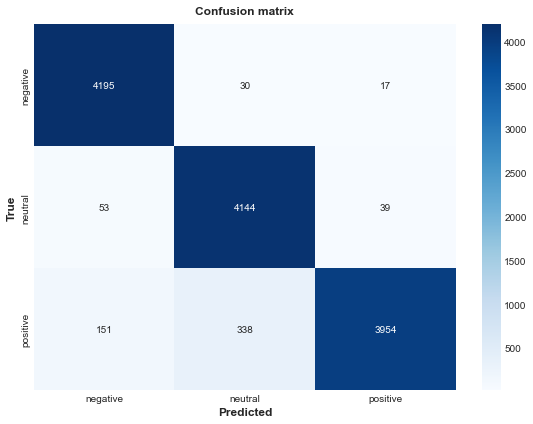

In [831]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

class_names = ['negative', 'neutral', 'positive'] # define class names

# create confusion matrix
cm = confusion_matrix(df2['true_sentiment'], df1['predicted_sentiment'], labels=class_names)

# plot confusion matrix
fig, ax = plt.subplots(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap="Blues", xticklabels=class_names, yticklabels=class_names, ax=ax)
plt.title('Confusion matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

In [832]:
from sklearn.metrics import classification_report

target_names = ['negative', 'neutral', 'positive']

print(classification_report(df2['true_sentiment'], df1['predicted_sentiment'], target_names=target_names))

              precision    recall  f1-score   support

    negative       0.95      0.99      0.97      4242
     neutral       0.92      0.98      0.95      4236
    positive       0.99      0.89      0.94      4443

    accuracy                           0.95     12921
   macro avg       0.95      0.95      0.95     12921
weighted avg       0.95      0.95      0.95     12921



#### Neutral

In [481]:
text_pred = 'India Garden is an average level restaurant'

In [833]:
text_pred = """We had dinner at India Garden. The food was okay-ish. Some dishes were good, while some where not. 
               Also, average customer service. I would rate it mid-level. Can try it out once!"""

In [834]:
text_pred

'We had dinner at India Garden. The food was okay-ish. Some dishes were good, while some where not. \n               Also, average customer service. I would rate it mid-level. Can try it out once!'

In [835]:
text_new = []

text_new.append(remove_mult_spaces(filter_chars(clean_hashtags(strip_all_entities(strip_emoji(text_pred))))))

In [836]:
text_new

['we had dinner at india garden the food was okayish some dishes were good while some where not also average customer service i would rate it midlevel can try it out once']

In [837]:
dp = pd.DataFrame(text_new, columns={'pred_text'})

In [838]:
dp

,pred_text
0,we had dinner at india garden the food was oka...


In [839]:
dp['pred_text']

0    we had dinner at india garden the food was oka...
Name: pred_text, dtype: object

In [840]:
dp['pred_text2'] = preprocess_text(dp['pred_text'])

In [841]:
dp

,pred_text,pred_text2
0,we had dinner at india garden the food was oka...,dinner india garden food okayish dish good als...


In [842]:
from nltk.tokenize import word_tokenize

In [843]:
# Tokenize the preprocessed text
dp['text_tok'] = dp['pred_text2'].apply(lambda x: word_tokenize(x))

In [844]:
dp

,pred_text,pred_text2,text_tok
0,we had dinner at india garden the food was oka...,dinner india garden food okayish dish good als...,"[dinner, india, garden, food, okayish, dish, g..."


In [845]:
dp['text_tok'].values

array([list(['dinner', 'india', 'garden', 'food', 'okayish', 'dish', 'good', 'also', 'average', 'customer', 'service', 'would', 'rate', 'midlevel', 'try'])],
      dtype=object)

In [846]:
# Train Word2Vec model on tokenized text
word2vec_single = Word2Vec(dp['text_tok'], vector_size=100, window=5, min_count=1)

In [847]:
# Convert tokenized text into numerical representation using Word2Vec
X_samp = []

for text in dp['text_tok']:
    X_samp.append([word2vec_model.wv[word] for word in text])

In [848]:
k = np.array(X_samp)

In [849]:
k

array([[[ 2.503429  ,  2.3664212 ,  0.14466627, ...,  1.1002451 ,
          1.1553663 , -1.4277446 ],
        [-2.5268674 ,  1.709557  ,  1.1830496 , ...,  2.1643085 ,
         -0.41574243,  1.1567957 ],
        [ 0.826602  ,  0.10972385,  0.8321019 , ...,  0.05369699,
         -0.9084357 , -0.71772003],
        ...,
        [ 2.3323803 , -0.61543363, -1.1370378 , ...,  0.5375115 ,
         -1.7151251 ,  1.8454214 ],
        [-0.01401444, -0.05415529, -0.06783043, ...,  0.00826079,
          0.15929055, -0.03349161],
        [ 1.9624386 , -2.7770739 , -2.2789164 , ..., -1.9654448 ,
          3.3906422 ,  0.55004483]]], dtype=float32)

In [850]:
k.shape

(1, 15, 100)

In [851]:
X_samp = pad_sequences(k, maxlen=128, padding='post')

In [852]:
X_samp.shape

(1, 128, 100)

In [853]:
model_cnn.predict(X_samp)

1/1 [==============================] - 0s 29ms/step


array([[0.28753603, 0.6665271 , 0.04593689]], dtype=float32)

In [854]:
pred = model_cnn.predict(X_samp)

1/1 [==============================] - 0s 30ms/step


In [855]:
# get the index of the maximum value for each row
sentiment_idx = np.argmax(pred, axis=1)

# map the index to sentiment labels
sentiments = np.array(['negative', 'neutral', 'positive'])[sentiment_idx]

# create a dataframe with predicted_sentiment column
dfp = pd.DataFrame(pred, columns=['negative', 'neutral', 'positive'])
print(dfp)
print('\n')
print('Sentiment: ', sentiments[0])

   negative   neutral  positive
0  0.287536  0.666527  0.045937


Sentiment:  neutral
